# **COVID-19 Analysis, Visualization, and several variables comparison**

# Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker 
import pycountry_convert as pc
import folium
import branca
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px
import json, requests

import wget
import zipfile

%matplotlib inline

# Datasets

### 2019 Novel Coronavirus COVID-19 (2019-nCoV) Data Repository by Johns Hopkins CSSE ([LINK](https://github.com/CSSEGISandData/COVID-19)) 

In [2]:
# Retriving Dataset
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

# Depricated
# df_recovered = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_19-covid-Recovered.csv')
df_covid19 = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])

### United Nations  ([LINK](https://www.un.org/en/development/desa/population/index.asp)) 

In [3]:
#population by country
df_population = pd.read_csv("https://population.un.org/wpp/Download/Files/1_Indicators%20(Standard)/CSV_FILES/WPP2019_TotalPopulationBySex.csv")

### The World bank ([LINK](https://data.worldbank.org)) 

Importing public health investment per capita

In [4]:
#import health per capita
# wget.download('http://api.worldbank.org/v2/en/indicator/SH.XPD.CHEX.PC.CD?downloadformat=csv',out="health_per_capita.zip")

100% [..............................................................................] 47329 / 47329

'health_per_capita.zip'

In [6]:
archive = zipfile.ZipFile('health_per_capita.zip', 'r')
healthdata = archive.open('API_SH.XPD.CHEX.PC.CD_DS2_en_csv_v2_1122778.csv')

In [7]:
df_health = pd.read_csv(healthdata,header=2)
healthdata.close()
df_health.shape

(264, 65)

In [8]:
df_health = df_health[['Country Name','Country Code','2017']].dropna()
print(df_health.shape)
df_health.head()

(231, 3)


,Country Name,Country Code,2017
1,Afghanistan,AFG,67.122650
2,Angola,AGO,114.459641
4,Andorra,AND,4040.786621
5,Arab World,ARB,345.789404
6,United Arab Emirates,ARE,1357.017456


Importing Hospital beds (per 1,000 people)

In [11]:
#import beds per 1000 people
# wget.download("http://api.worldbank.org/v2/en/indicator/SH.MED.BEDS.ZS?downloadformat=csv", out="beds_per1000.zip")

archive = zipfile.ZipFile('beds_per1000.zip', 'r')
beds = archive.open('API_SH.MED.BEDS.ZS_DS2_en_csv_v2_1120885.csv')
df_beds = pd.read_csv(beds,header=2)
beds.close()
df_beds.shape

100% [..............................................................................] 33550 / 33550

(264, 65)

In [12]:
#Beds data is missing for most countries last years
#we will pick the las data

df_beds['last_data'] = None
df_beds['last_year'] = None

for index, row in df_beds.iterrows():
    years = row[4:]
    data = years[~years.isna()]
    if not data.empty:
        df_beds.loc[index, 'last_data'] = data[-1]
        df_beds.loc[index, 'last_year'] = years[~years.isna()].index[-1]
        
df_beds.shape

(264, 67)

In [13]:
df_beds = df_beds[['Country Name','Country Code','last_data','last_year']].dropna()
print(df_beds.shape)
df_beds.head()

(246, 4)


,Country Name,Country Code,last_data,last_year
1,Afghanistan,AFG,0.5,2015
2,Angola,AGO,0.8,2005
3,Albania,ALB,2.9,2013
4,Andorra,AND,2.5,2009
5,Arab World,ARB,1.62452,2014


#### Current health expenditure per GDP

In [15]:
# wget.download('http://api.worldbank.org/v2/en/indicator/SH.XPD.CHEX.GD.ZS?downloadformat=csv', out="healthGDP.zip")
archive = zipfile.ZipFile('healthGDP.zip', 'r')
healthgdp = archive.open('API_SH.XPD.CHEX.GD.ZS_DS2_en_csv_v2_1120917.csv')
df_gdp = pd.read_csv(healthgdp,header=2)
healthgdp.close()
df_gdp.shape

(264, 65)

In [16]:
#GDP data is missing for most countries last years
#we will pick the las data
df_gdp['last_hgdp_data'] = None
df_gdp['last_hgdp_year'] = None

for index, row in df_gdp.iterrows():
    years = row[4:]
    data = years[~years.isna()]
    if not data.empty:
        df_gdp.loc[index, 'last_hgdp_data'] = data[-1]
        df_gdp.loc[index, 'last_hgdp_year'] = years[~years.isna()].index[-1]
        
df_gdp.shape


(264, 67)

[6.81606158614159 6.783133745193481 6.80292323231697 7.5289495289325705
 7.615680992603299 7.67285749316216 7.754267752170559 7.8322030603885695
 8.28874111175537 8.9841827750206 9.01127234101295 9.078246355056761
 9.071517735719679 9.02014523744583 9.02362614870071 9.109248220920561
 8.971408009529108 8.873129636049269]
['2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017']


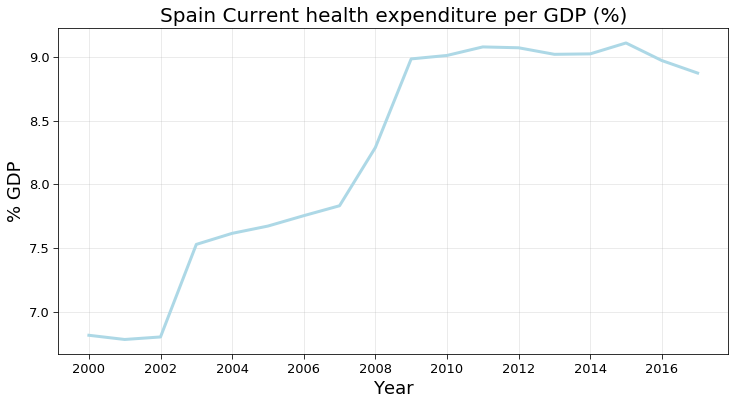

In [17]:
y = df_gdp[df_gdp['Country Name'] == 'Spain'].dropna(axis=1).iloc[:,4:].values[0][:-2]
x = df_gdp[df_gdp['Country Name'] == 'Spain'].dropna(axis=1).iloc[:,4:].columns[:-2].tolist()
print(y)
print(x)
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
ax.plot(x, y, color='lightblue', linewidth=3)
plt.title('Spain Current health expenditure per GDP (%)', fontsize=20)
plt.tick_params(size=5,labelsize = 13)
plt.xticks([0,2,4,6,8,10,12,14,16])
plt.xlabel("Year",fontsize=18)
plt.ylabel("% GDP",fontsize=18)
plt.grid(alpha=0.3,which='both')

In [18]:
df_healthgdp = df_gdp[['Country Name','Country Code','last_hgdp_data','last_hgdp_year']].dropna()
print(df_healthgdp.shape)
df_healthgdp.head()

(234, 4)


,Country Name,Country Code,last_hgdp_data,last_hgdp_year
1,Afghanistan,AFG,11.7772,2017
2,Angola,AGO,2.7915,2017
4,Andorra,AND,10.3206,2017
5,Arab World,ARB,4.91097,2017
6,United Arab Emirates,ARE,3.33428,2017


### Oxford COVID-19 Government Response Tracker ([LINK](https://covidtracker.bsg.ox.ac.uk/)) 

BBC article using the stringency data ([LINK](https://www.bbc.com/news/world-52103747)) 

#### Stringrency data

In [20]:
df_stringency = pd.read_csv("https://oxcgrtportal.azurewebsites.net/api/CSVDownload")

### Eurostat ([LINK](https://ec.europa.eu/eurostat/databrowser/view/tps00168/default/table?lang=en))

#### Acute care hospital beds

In [21]:
#df_acutebeds = pd.read_csv("https://dw.euro.who.int/api/v3/export/HFA_478?lang=EN&format=csv")
df_acutebeds_source = pd.read_csv("https://ec.europa.eu/eurostat/estat-navtree-portlet-prod/BulkDownloadListing?file=data/tps00168.tsv.gz",
                          sep='\t')

In [22]:
df_acutebeds_source['country_code'] = df_acutebeds_source.iloc[:,0].str.split(',',expand=True)[2]
df_acutebeds_source.columns = df_acutebeds_source.columns.str.strip(' ')

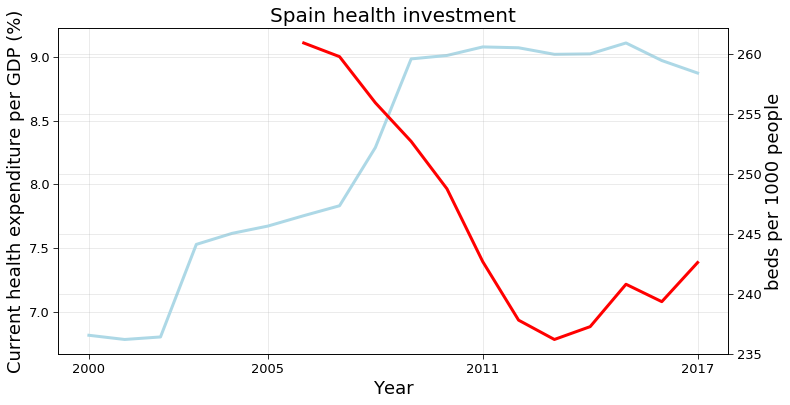

In [23]:
y = df_gdp[df_gdp['Country Name'] == 'Spain'].dropna(axis=1).iloc[:,4:].values[0][:-2]
x = np.array(df_gdp[df_gdp['Country Name'] == 'Spain'].dropna(axis=1).iloc[:,4:].columns[:-2].tolist()).astype('int32')

es = df_acutebeds_source[df_acutebeds_source['country_code'] == 'ES']
bedsy = es[es.columns[1:-1]].apply(float).values
bedsx = np.array(es[es.columns[1:-1]].columns.tolist()).astype('int32')

fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
ax.plot(x, y, color='lightblue', linewidth=3)
plt.tick_params(size=5,labelsize = 13)
plt.xticks([0,2,4,6,8,10,12,14,16])
plt.xlabel("Year",fontsize=18)
plt.ylabel("Current health expenditure per GDP (%)",fontsize=18)
plt.grid(alpha=0.3,which='both')

ax2 = ax.twinx()
ax2.plot(bedsx, bedsy, color='red', linewidth=3)
plt.title('Spain health investment', fontsize=20)
plt.tick_params(size=5,labelsize = 13)
plt.xticks(np.linspace(2000,2017,4, dtype='int32'))
plt.xlabel("Year",fontsize=18)
plt.ylabel("beds per 1000 people",fontsize=18)
plt.grid(alpha=0.3,which='both')

In [24]:
es = df_acutebeds_source[df_acutebeds_source['country_code'] == 'ES']
es[es.columns[1:-1]]

,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
10,260.90,259.76,255.92,252.70,248.75,242.68,237.81,236.20,237.27,240.80,239.35,242.61


In [25]:
df_acutebeds = df_acutebeds_source[['country_code','2017']]

In [26]:
df_acutebeds = df_acutebeds.rename(columns={'2017':'acute_beds'})
df_acutebeds['country'] = None

In [27]:
df_acutebeds_source

,"unit,facility,geo\time",2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,country_code
0,"P_HTHAB,HBEDT_CUR,AT",637.09,637.96,629.26,622.86,615.83,610.00,599.54,587.18,577.97,565.33,554.81,544.70,AT
1,"P_HTHAB,HBEDT_CUR,BE",569.50 b,561.43,559.38,548.74,544.69,538.33,530.11,524.39,524.37,519.16,512.07,500.45,BE
2,"P_HTHAB,HBEDT_CUR,BG",527.24,542.72,554.38,564.84,557.37,546.45,559.59,572.94,593.18,600.95,603.13,616.82,BG
3,"P_HTHAB,HBEDT_CUR,CH",453.96,448.30,434.79,426.64,390.13 b,379.48,373.26,365.51,361.95,358.46,348.65,355.63,CH
4,"P_HTHAB,HBEDT_CUR,CY",380.31,380.12,378.45,376.22,356.62,351.17,346.09,340.86,341.58,341.53,342.67,339.96,CY
5,"P_HTHAB,HBEDT_CUR,CZ",527.73,520.95,510.17,500.67,479.93,459.09,445.86,421.76,418.49,416.21,414.27,410.89,CZ
6,"P_HTHAB,HBEDT_CUR,DE",620.04,616.23,613.03,614.56,620.58,625.39,623.52,620.83,618.26,611.30,605.62,601.50,DE
7,"P_HTHAB,HBEDT_CUR,DK",372.10,360.36,350.75,343.92,343.55,306.70 b,:,300.40,261.82 b,245.66,252.46,253.62,DK
8,"P_HTHAB,HBEDT_CUR,EE",418.99,406.66,412.09,390.03,375.67,383.14,385.05,366.84,366.75,368.02,350.21,344.55,EE
9,"P_HTHAB,HBEDT_CUR,EL",398.94,400.45,400.95,411.71,365.64,367.23,365.64,352.24,349.69,360.40 b,357.00,360.28,EL


# Preprocessing

In [28]:
for ii,row in df_acutebeds.iterrows():
    try:
        df_acutebeds.loc[ii,'country'] = pc.country_alpha2_to_country_name(row['country_code'])
    except:
        if (row['country_code'] == 'UK'):
            df_acutebeds.loc[ii,'country'] = 'United Kingdom'
        else:
            df_acutebeds.loc[ii,'country'] = None

In [29]:
population = df_population[(df_population['Time'] == 2019) &  (df_population['Variant'] == "Medium")]
population = population[['Location','PopTotal','PopDensity']]
population = population.rename(columns={"Location":"country"})
population.index = population['country']
population.head()

,country,PopTotal,PopDensity
country,,,
Afghanistan,Afghanistan,38041.757,58.269
Africa,Africa,1308064.176,44.119
African Group,African Group,1306320.572,44.464
African Union,African Union,1306903.030,44.085
African Union: Central Africa,African Union: Central Africa,154013.705,29.192


In [30]:
df_confirmed = df_confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
df_deaths = df_deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
df_covid19 = df_covid19.rename(columns={"Country_Region": "country"})
df_covid19["Active"] = df_covid19["Confirmed"]-df_covid19["Recovered"]-df_covid19["Deaths"]
# df_recovered = df_recovered.rename(columns={"Province/State":"state","Country/Region": "country"})

In [31]:
# Changing the conuntry names as required by pycountry_convert Lib
population.loc[population['country'] == "United States of America", "country"] = "USA"
population.loc[population['country'] == "Republic of Korea",  "country"] = 'South Korea'
population.loc[population['country'] == "China, Taiwan Province of China",  "country"] = 'Taiwan'
population.loc[population['country'] == "Congo",  "country"] = 'Republic of the Congo'
population.loc[population['country'] == "Venezuela (Bolivarian Republic of)",  "country"] = 'Venezuela'
population.loc[population['country'] == "Russian Federation",  "country"] = 'Russia'
population.loc[population['country'] == "Iran (Islamic Republic of)",  "country"] = 'Irán'
population.loc[population['country'] == "United Republic of Tanzania",  "country"] = 'Tanzania'
population.loc[population['country'] == "Bolivia (Plurinational State of)",  "country"] = 'Bolivia'

In [32]:
df_health = df_health.rename(columns={"Country Name":"country"})

In [33]:
# Changing the conuntry names as required by pycountry_convert Lib
df_health.loc[df_health['country'] == "United States", "country"] = "USA"
df_health.loc[df_health['country'] == "Korea, Rep.",  "country"] = 'South Korea'
df_health.loc[df_health['country'] == "China, Taiwan Province of China",  "country"] = 'Taiwan'
df_health.loc[df_health['country'] == "Congo, Rep.",  "country"] = 'Republic of the Congo'
df_health.loc[df_health['country'] == "Congo, Dem. Rep.",  "country"] = 'Democratic Republic of the Congo'
df_health.loc[df_health['country'] == "Venezuela, RB",  "country"] = 'Venezuela'
df_health.loc[df_health['country'] == "Russian Federation",  "country"] = 'Russia'
df_health.loc[df_health['country'] == "Iran, Islamic Rep.",  "country"] = 'Irán'
df_health.loc[df_health['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_health.loc[df_health['country'] == "Reunion", "country"] = "Réunion"

In [34]:
df_beds = df_beds.rename(columns={"Country Name":"country"})

In [35]:
# Changing the conuntry names as required by pycountry_convert Lib
df_beds.loc[df_beds['country'] == "United States", "country"] = "USA"
df_beds.loc[df_beds['country'] == "Korea, Rep.",  "country"] = 'South Korea'
df_beds.loc[df_beds['country'] == "China, Taiwan Province of China",  "country"] = 'Taiwan'
df_beds.loc[df_beds['country'] == "Congo, Rep.",  "country"] = 'Republic of the Congo'
df_beds.loc[df_beds['country'] == "Congo, Dem. Rep.",  "country"] = 'Democratic Republic of the Congo'
df_beds.loc[df_beds['country'] == "Venezuela, RB",  "country"] = 'Venezuela'
df_beds.loc[df_beds['country'] == "Russian Federation",  "country"] = 'Russia'
df_beds.loc[df_beds['country'] == "Iran, Islamic Rep.",  "country"] = 'Irán'
df_beds.loc[df_beds['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_beds.loc[df_beds['country'] == "Reunion", "country"] = "Réunion"

In [36]:
df_healthgdp = df_healthgdp.rename(columns={"Country Name":"country"})

In [37]:
# Changing the conuntry names as required by pycountry_convert Lib
df_healthgdp.loc[df_healthgdp['country'] == "United States", "country"] = "USA"
df_healthgdp.loc[df_healthgdp['country'] == "Korea, Rep.",  "country"] = 'South Korea'
df_healthgdp.loc[df_healthgdp['country'] == "China, Taiwan Province of China",  "country"] = 'Taiwan'
df_healthgdp.loc[df_healthgdp['country'] == "Congo, Rep.",  "country"] = 'Republic of the Congo'
df_healthgdp.loc[df_healthgdp['country'] == "Congo, Dem. Rep.",  "country"] = 'Democratic Republic of the Congo'
df_healthgdp.loc[df_healthgdp['country'] == "Venezuela, RB",  "country"] = 'Venezuela'
df_healthgdp.loc[df_healthgdp['country'] == "Russian Federation",  "country"] = 'Russia'
df_healthgdp.loc[df_healthgdp['country'] == "Iran, Islamic Rep.",  "country"] = 'Irán'
df_healthgdp.loc[df_healthgdp['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_healthgdp.loc[df_healthgdp['country'] == "Reunion", "country"] = "Réunion"

In [38]:
#stringency
df_stringency[df_stringency['CountryName'].str.contains('South')].CountryName.unique()

array(['South Korea', 'South Sudan', 'South Africa'], dtype=object)

In [39]:
#stringency
df_stringency.loc[df_stringency['CountryName'] == "United States", "CountryName"] = "USA"

In [40]:
#df_confirmed.loc[df_confirmed['country'].str.contains("Taji")] 

In [41]:
# Changing the conuntry names as required by pycountry_convert Lib
df_confirmed.loc[df_confirmed['country'] == "US", "country"] = "USA"
df_deaths.loc[df_deaths['country'] == "US", "country"] = "USA"
df_covid19.loc[df_covid19['country'] == "US", "country"] = "USA"
df_table.loc[df_table['Country_Region'] == "US", "Country_Region"] = "USA"
# df_recovered.loc[df_recovered['country'] == "US", "country"] = "USA"


df_confirmed.loc[df_confirmed['country'] == 'Korea, South', "country"] = 'South Korea'
df_deaths.loc[df_deaths['country'] == 'Korea, South', "country"] = 'South Korea'
df_covid19.loc[df_covid19['country'] == "Korea, South", "country"] = "South Korea"
df_table.loc[df_table['Country_Region'] == "Korea, South", "Country_Region"] = "South Korea"
# df_recovered.loc[df_recovered['country'] == 'Korea, South', "country"] = 'South Korea'

df_confirmed.loc[df_confirmed['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_deaths.loc[df_deaths['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_covid19.loc[df_covid19['country'] == "Taiwan*", "country"] = "Taiwan"
df_table.loc[df_table['Country_Region'] == "Taiwan*", "Country_Region"] = "Taiwan"
# df_recovered.loc[df_recovered['country'] == 'Taiwan*', "country"] = 'Taiwan'

df_confirmed.loc[df_confirmed['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Kinshasa)", "country"] = "Democratic Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Kinshasa)", "Country_Region"] = "Democratic Republic of the Congo"
# df_recovered.loc[df_recovered['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_deaths.loc[df_deaths['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_covid19.loc[df_covid19['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_table.loc[df_table['Country_Region'] == "Cote d'Ivoire", "Country_Region"] = "Côte d'Ivoire"
# df_recovered.loc[df_recovered['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"

df_confirmed.loc[df_confirmed['country'] == "Reunion", "country"] = "Réunion"
df_deaths.loc[df_deaths['country'] == "Reunion", "country"] = "Réunion"
df_covid19.loc[df_covid19['country'] == "Reunion", "country"] = "Réunion"
df_table.loc[df_table['Country_Region'] == "Reunion", "Country_Region"] = "Réunion"
# df_recovered.loc[df_recovered['country'] == "Reunion", "country"] = "Réunion"

df_confirmed.loc[df_confirmed['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Brazzaville)", "country"] = "Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Brazzaville)", "Country_Region"] = "Republic of the Congo"
# df_recovered.loc[df_recovered['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_deaths.loc[df_deaths['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_covid19.loc[df_covid19['country'] == "Bahamas, The", "country"] = "Bahamas"
df_table.loc[df_table['Country_Region'] == "Bahamas, The", "Country_Region"] = "Bahamas"
# df_recovered.loc[df_recovered['country'] == 'Bahamas, The', "country"] = 'Bahamas'

df_confirmed.loc[df_confirmed['country'] == 'Gambia, The', "country"] = 'Gambia'
df_deaths.loc[df_deaths['country'] == 'Gambia, The', "country"] = 'Gambia'
df_covid19.loc[df_covid19['country'] == "Gambia, The", "country"] = "Gambia"
df_table.loc[df_table['Country_Region'] == "Gambia", "Country_Region"] = "Gambia"
# df_recovered.loc[df_recovered['country'] == 'Gambia, The', "country"] = 'Gambia'

# getting all countries
countries = np.asarray(df_confirmed["country"])
countries1 = np.asarray(df_covid19["country"])
# Continent_code to Continent_names
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

# Defininng Function for getting continent code for country.
def country_to_continent_code(country):
    try:
        return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
    except :
        return 'na'

#Collecting Continent Information
df_confirmed.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries[:]])
df_deaths.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries[:]])
df_covid19.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in countries1[:]])
df_table.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in df_table["Country_Region"].values])
# df_recovered.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries[:]] )   

In [42]:
df_table = df_table[df_table["continent"] != "Others"]

In [43]:
df_confirmed = df_confirmed.replace(np.nan, '', regex=True)
df_deaths = df_deaths.replace(np.nan, '', regex=True)

In [44]:
df_stringency

,CountryName,CountryCode,Date,C1_School closing,C1_Flag,C1_Notes,C2_Workplace closing,C2_Flag,C2_Notes,C3_Cancel public events,...,StringencyIndex,StringencyIndexForDisplay,StringencyLegacyIndex,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay
0,Aruba,ABW,20200101,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
1,Aruba,ABW,20200102,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
2,Aruba,ABW,20200103,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
3,Aruba,ABW,20200104,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
4,Aruba,ABW,20200105,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
5,Aruba,ABW,20200106,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
6,Aruba,ABW,20200107,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
7,Aruba,ABW,20200108,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
8,Aruba,ABW,20200109,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
9,Aruba,ABW,20200110,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0


# Functions

In [45]:
#function to calculate the date when schools close (S1)

from datetime import datetime

def dateS1(country, df):
    date = 20200101
    s = df[df['CountryName'] == country]
    try:
        date = s[s['C1_School closing'] > 0].iloc[0,2]
    except IndexError as error:
        print(error)
        return  None
    return datetime.strptime(str(date), "%Y%m%d") 

#fuction to find the date first case
def dateFirst(country, df, th=0):
    date = "1/22/20"
    try:
        c = df.groupby('country').sum().drop(["Lat","Long"],axis =1).sort_values(df.columns[-1], ascending= False)
        c = c.loc[country,:]
    except KeyError as error:
        print(error)
        return None
    try:
        date = c[c > th].index[0]
    except IndexError as error:
            print(error)
            return None
    return datetime.strptime(date, "%m/%d/%y")


In [46]:
#ejemplo
#primer_remedio = dateS1("Sweden",df_stringency)
#primer_caso = dateFirst("Spain",df_confirmed)

#print(primer_caso)
#print(primer_remedio)

#print((primer_remedio - primer_caso).days)

#convert dates
#from datetime import datetime
#date_object = datetime.strptime(primer_caso, "%m/%d/%y")
#print("date object =", date_object)
#date_object2 = datetime.strptime(primer_remedio, "%Y%m%d")
#print("date object2 =", date_object2)

In [47]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)
    
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19 Cases for "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
        
def get_total_cases(cases, country = "All"):
    if(country == "All") :
        return np.sum(np.asarray(cases.iloc[:,5:]),axis = 0)[-1]
    else :
        return np.sum(np.asarray(cases[cases["country"] == country].iloc[:,5:]),axis = 0)[-1]
    
def get_mortality_rate(confirmed,deaths, continent = None, country = None):
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else :
        params = ["All", "All"]
    
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(confirmed.iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths.iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    else :
        Total_confirmed =  np.sum(np.asarray(confirmed[confirmed[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths[deaths[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    
    return np.nan_to_num(mortality_rate)
def dd(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days


out = "output/"#+"output/"

# General Analysis

In [48]:
df_countries_cases = df_covid19.copy().drop(['Lat','Long_','continent','Last_Update'],axis =1)
df_countries_cases.index = df_countries_cases["country"]
df_countries_cases = df_countries_cases.drop(['country'],axis=1)

df_continents_cases = df_covid19.copy().drop(['Lat','Long_','country','Last_Update'],axis =1)
df_continents_cases = df_continents_cases.groupby(["continent"]).sum()

### Top 10 countries (Confirmed Cases and Deaths)

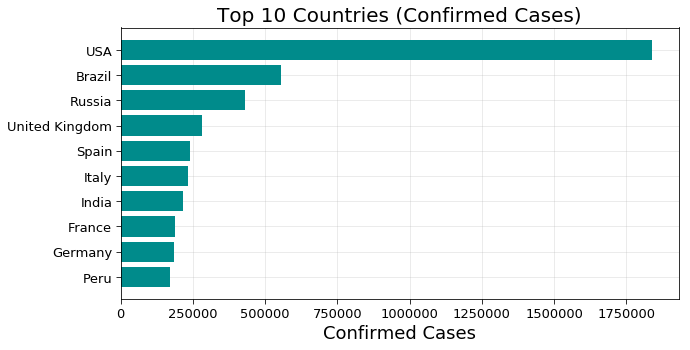

In [49]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig(out+'Top 10 Countries (Confirmed Cases).png')

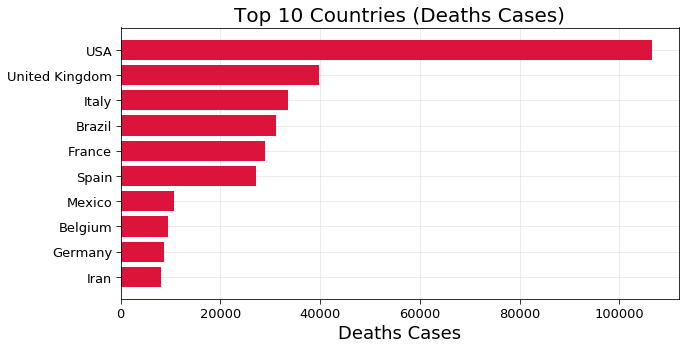

In [50]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-10:],df_countries_cases.sort_values('Deaths')["Deaths"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths Cases",fontsize=18)
plt.title("Top 10 Countries (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Deaths Cases).png')

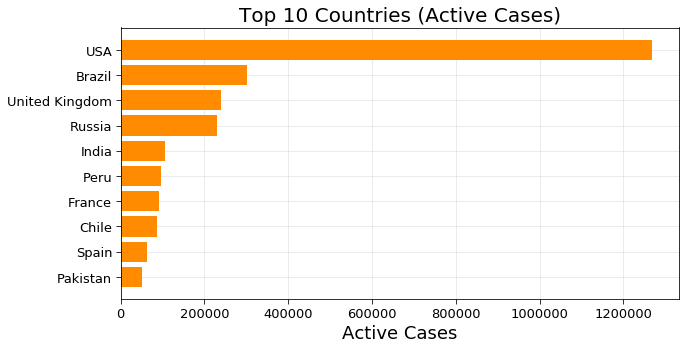

In [51]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Active')["Active"].index[-10:],df_countries_cases.sort_values('Active')["Active"].values[-10:],color="darkorange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Active Cases",fontsize=18)
plt.title("Top 10 Countries (Active Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Active Cases).png')

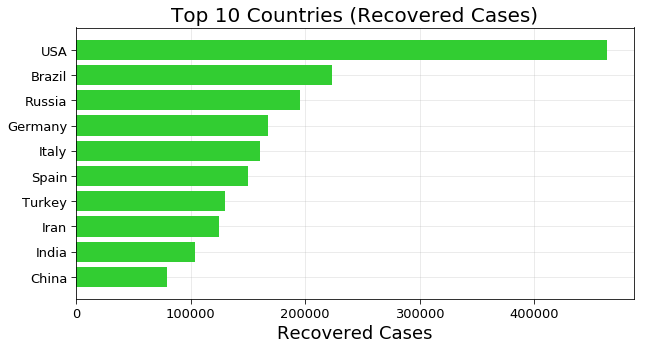

In [52]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Recovered')["Recovered"].index[-10:],df_countries_cases.sort_values('Recovered')["Recovered"].values[-10:],color="limegreen")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Recovered Cases",fontsize=18)
plt.title("Top 10 Countries (Recovered Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Recovered Cases).png')

## Maps deaths

In [53]:
temp_df = pd.DataFrame(df_countries_cases['Deaths'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df.iloc[:,-1]+1), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Deaths"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Deaths Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Deaths (Log Scale)",colorscale="Reds")
# fig.to_image("Global Heat Map deaths.png")
vec = [0,0.5,1,1.5,2,2.5,3,3.5,4]

fig.update_layout(coloraxis_colorbar=dict(
    title="Deaths Heat Map (Log Scale)",
    tickvals=vec,
    ticktext=np.power(10,vec).astype(int)
))

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

### Deaths map by population

In [54]:
temp_df = pd.DataFrame(df_countries_cases['Deaths'])
temp_df = temp_df.reset_index()
ttter = temp_df.copy()
ttter.index = ttter['country']
ttter = ttter.drop(columns =['country'])
perro = pd.concat([ttter, population.drop(columns =['country'])], axis=1, join='inner')
perro = perro.reset_index()
perro['deaths100k'] = perro['Deaths']/(perro['PopTotal']*1000)*100000

fig = px.choropleth(perro, locations="country",
                    color=np.log10(perro.iloc[:,-1]+1), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["deaths100k"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Deaths per 100k population")
fig.update_coloraxes(colorbar_title="Deaths per 100k (Log Scale)",colorscale="Purples")
# fig.to_image("Global Heat Map deaths.png")
vec = [0,0.5,1,1.5,2]

fig.update_layout(coloraxis_colorbar=dict(
    title="Deaths per 100k (Log Scale)",
    tickvals=vec,
    ticktext=np.power(10,vec).astype(int)
))

#fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.write_html(out+"Deathsper100k.html", include_plotlyjs='cdn')
fig.show()

## Deaths per 100k population

In [55]:
temp_df = pd.DataFrame(df_countries_cases['Deaths'])
temp_df = temp_df.reset_index()
ttter = temp_df.copy()
ttter.index = ttter['country']
ttter = ttter.drop(columns =['country'])
perro = pd.concat([ttter, population.drop(columns =['country'])], axis=1, join='inner')
perro = perro.reset_index()
perro['deaths100k'] = perro['Deaths']/(perro['PopTotal']*1000)*100000
perro['mortality'] = perro['Deaths']/(perro['PopTotal']*1000)*100

In [56]:
perro[perro['PopTotal'] > 100].sort_values('mortality', ascending=False).head(10)

,country,Deaths,PopTotal,PopDensity,deaths100k,mortality
40,Belgium,9522.0,11539.326,381.087,82.517818,0.082518
16,United Kingdom,39811.0,67530.161,279.131,58.952917,0.058953
18,Spain,27128.0,46736.782,93.698,58.044219,0.058044
10,Italy,33601.0,60550.092,205.855,55.492897,0.055493
14,Sweden,4542.0,10036.391,24.459,45.255311,0.045255
6,France,28943.0,65129.731,118.946,44.438998,0.044439
11,Netherlands,5996.0,17097.123,507.032,35.070228,0.035070
9,Ireland,1658.0,4882.498,70.874,33.958027,0.033958
17,USA,106553.0,329064.917,35.974,32.380541,0.032381
15,Switzerland,1921.0,8591.361,217.415,22.359670,0.022360


La columna PopTotal esta en 1 miles

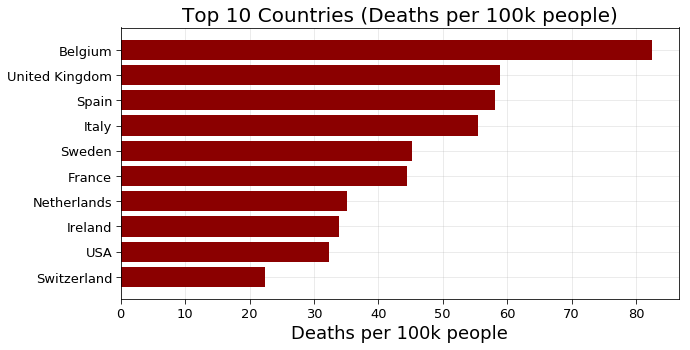

In [57]:
#paises mas de un millon
paises_mas1M = perro[perro['PopTotal'] > 1000]

f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(paises_mas1M.sort_values('deaths100k')["country"].values[-10:],paises_mas1M.sort_values('deaths100k')["deaths100k"].values[-10:],color="darkred")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths per 100k people",fontsize=18)
plt.title("Top 10 Countries (Deaths per 100k people)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig(out+'Top 10 Countries (Deaths per 100k people).png')

d:\program files\python37\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning:


Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.

d:\program files\python37\lib\site-packages\pandas\core\indexing.py:1494: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


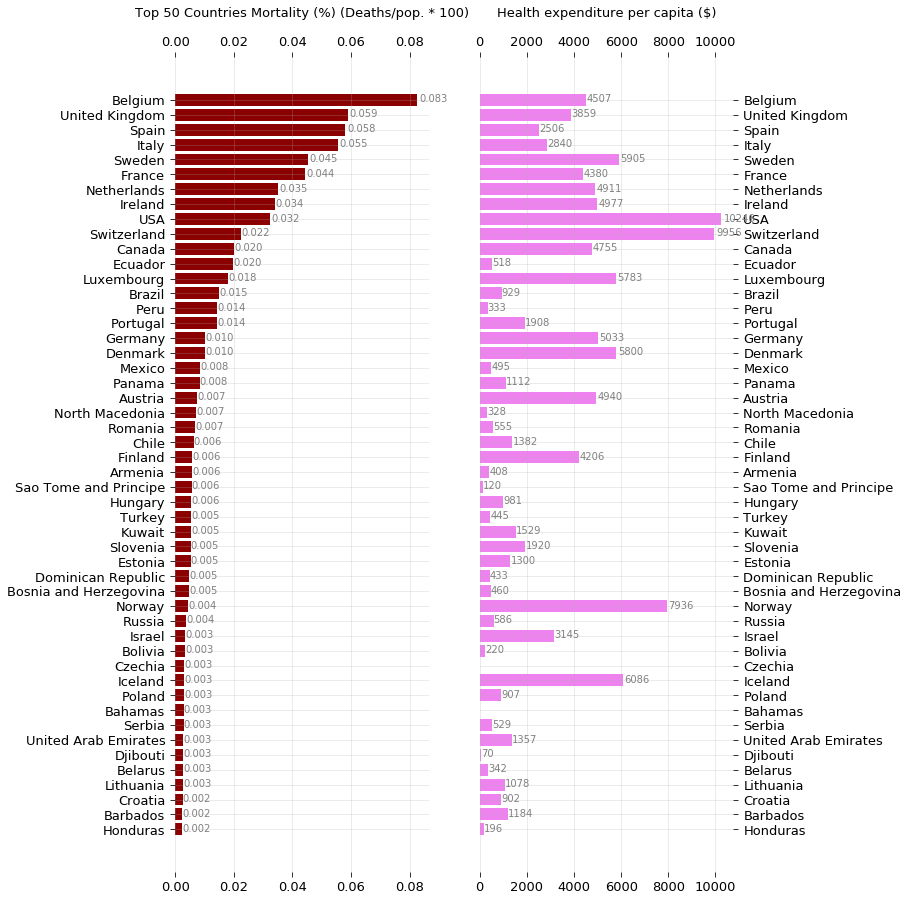

In [58]:
top = 50
chucho = perro[perro['PopTotal'] > 100].sort_values('mortality')
chucho.index = chucho.country

padtitle = 40

f = plt.figure(figsize=(10,15))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)


#f.tight_layout(pad=0.05)

countries = chucho["mortality"].index[-top:].tolist()

#ax1.axes(axisbelow=True)
ax1.barh(chucho["mortality"].index[-top:],chucho["mortality"].values[-top:],color="darkred")
ax1.tick_params(size=5,labelsize = 13)
ax1.set_title("Top {} Countries Mortality (%) (Deaths/pop. * 100)".format(top),fontsize=13, pad=padtitle)   
ax1.grid(alpha=0.3,which='both')
ax1.spines['bottom'].set_linewidth(0)
ax1.spines['top'].set_linewidth(0)
ax1.spines['right'].set_linewidth(0)
ax1.spines['left'].set_linewidth(0)
for i in ax1.patches:
    ax1.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.3f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
#plt.savefig(out+'Top 10 Countries (Mortality).png')
ax1.xaxis.set_tick_params(labeltop='on',top=True)
ax1.tick_params(axis="y", pad=5)

health = df_health.copy()
health.index = health.country

pepito = health.loc[chucho["mortality"].index[-top:].tolist(),:]

#plt.axes(axisbelow=True)
ax2.barh(pepito['2017'].index[-top:],pepito['2017'].values[-top:],color="violet")
ax2.tick_params(size=5,labelsize = 13)
ax2.set_title("Health expenditure per capita ($)",fontsize=13, pad=padtitle)             
ax2.grid(alpha=0.3,which='both')
ax2.yaxis.tick_right()
ax2.grid(alpha=0.3,which='both')
ax2.spines['bottom'].set_linewidth(0)
ax2.spines['top'].set_linewidth(0)
ax2.spines['right'].set_linewidth(0)
ax2.spines['left'].set_linewidth(0)
for i in ax2.patches:
    ax2.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.0f}".format(i.get_width()), 
            fontsize=10,
            color='gray')

ax2.xaxis.set_tick_params(labeltop='on',top=True)
ax2.tick_params(axis="y", pad=5)

plt.savefig(out+'mortality and health expenditure all.png')

In [59]:
pepito.sort_values(by='2017', ascending=False)

,country,Country Code,2017
country,,,
USA,USA,USA,10246.138672
Switzerland,Switzerland,CHE,9956.259766
Norway,Norway,NOR,7936.375000
Iceland,Iceland,ISL,6086.311523
Sweden,Sweden,SWE,5904.583984
Denmark,Denmark,DNK,5800.151367
Luxembourg,Luxembourg,LUX,5782.628418
Germany,Germany,DEU,5033.452148
Ireland,Ireland,IRL,4976.862305


In [60]:
df_countries_cases.loc[countries,:]

,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3
country,,,,,,,,,,
Honduras,5527.0,225.0,563.0,4739.0,55.802309,NaN,NaN,4.070925,340,HND
Barbados,92.0,7.0,76.0,9.0,32.014365,NaN,NaN,7.608696,52,BRB
Croatia,2246.0,103.0,2095.0,48.0,54.710192,NaN,NaN,4.585931,191,HRV
Lithuania,1684.0,71.0,1260.0,353.0,61.859662,NaN,NaN,4.216152,440,LTU
Belarus,45116.0,248.0,20171.0,24697.0,477.452295,NaN,NaN,0.549694,112,BLR
Djibouti,3935.0,26.0,1636.0,2273.0,398.278546,NaN,NaN,0.660737,262,DJI
United Arab Emirates,35788.0,269.0,18726.0,16793.0,361.845830,NaN,NaN,0.751649,784,ARE
Serbia,11523.0,245.0,6852.0,4426.0,131.881791,NaN,NaN,2.126182,688,SRB
Bahamas,102.0,11.0,49.0,42.0,25.937831,NaN,NaN,10.784314,44,BHS


### Analysis comparatory against health investment per capita and reaction time

In [61]:
df_stringency

,CountryName,CountryCode,Date,C1_School closing,C1_Flag,C1_Notes,C2_Workplace closing,C2_Flag,C2_Notes,C3_Cancel public events,...,StringencyIndex,StringencyIndexForDisplay,StringencyLegacyIndex,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay
0,Aruba,ABW,20200101,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
1,Aruba,ABW,20200102,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
2,Aruba,ABW,20200103,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
3,Aruba,ABW,20200104,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
4,Aruba,ABW,20200105,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
5,Aruba,ABW,20200106,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
6,Aruba,ABW,20200107,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
7,Aruba,ABW,20200108,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
8,Aruba,ABW,20200109,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
9,Aruba,ABW,20200110,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0


single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds


d:\program files\python37\lib\site-packages\pandas\core\indexing.py:1494: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike



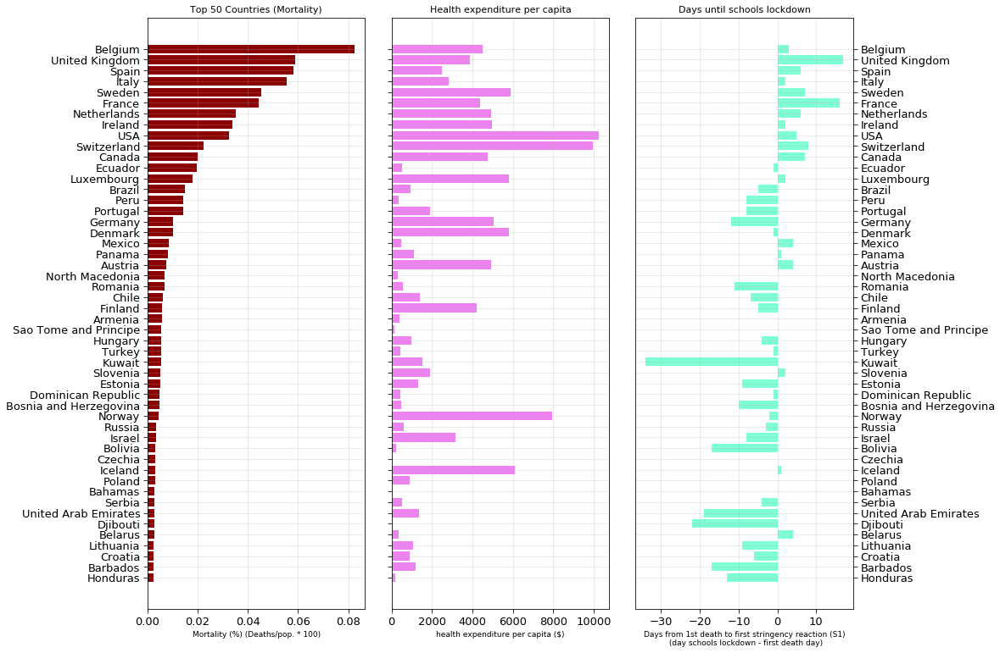

In [62]:
top = 50
indice = chucho["mortality"].index[-top:]
dias_primer_caso = [dateFirst(country,df_deaths,0) for country in indice.tolist()]
dias_primera_accion = [dateS1(country,df_stringency) for country in indice.tolist()]

df_actuacion = pd.DataFrame({'country':indice.tolist(),
              'first_case':dias_primer_caso,
              'first_measure':dias_primera_accion})

df_actuacion['dias_en_actuar'] = df_actuacion['first_measure'] - df_actuacion['first_case']
#df_actuacion = df_actuacion.replace({pd.np.nan: None})

df_actuacion['dias_en_actuar'] = df_actuacion['dias_en_actuar'].apply(lambda x: x.days)


f = plt.figure(figsize=(12,10))
ax1 = f.add_subplot(131)
ax2 = f.add_subplot(132)
ax3 = f.add_subplot(133)

f.tight_layout(pad=0.05)



#ax1.axes(axisbelow=True)
ax1.barh(chucho["mortality"].index[-top:],chucho["mortality"].values[-top:],color="darkred")
ax1.tick_params(size=5,labelsize = 13)
ax1.set_xlabel("Mortality (%) (Deaths/pop. * 100)",fontsize=9)
ax1.set_title("Top {} Countries (Mortality)".format(top),fontsize=11)
ax1.grid(alpha=0.3,which='both')
#plt.savefig(out+'Top 10 Countries (Mortality).png')

health = df_health.copy()
health.index = health.country

pepito = health.loc[chucho["mortality"].index[-top:].tolist(),:]

#plt.axes(axisbelow=True)
ax2.barh(pepito['2017'].index[-top:],pepito['2017'].values[-top:],color="violet")
ax2.tick_params(size=5,labelsize = 13)
ax2.set_xlabel("health expenditure per capita ($)",fontsize=9)
ax2.set_title("Health expenditure per capita",fontsize=11)
ax2.set_yticklabels([])
ax2.grid(alpha=0.3,which='both')

#plt.axes(axisbelow=True)
ax3.barh(df_actuacion.country,df_actuacion.fillna(0).dias_en_actuar,color="aquamarine")
ax3.tick_params(size=5,labelsize = 13)
ax3.set_xlabel("Days from 1st death to first stringency reaction (S1)\n (day schools lockdown - first death day)",fontsize=9)
ax3.set_title("Days until schools lockdown",fontsize=11)
ax3.yaxis.tick_right()
ax3.grid(alpha=0.3,which='both')

plt.savefig('mortality and health and reaction.png')

### Analysis comparatory against beds per 100k and reaction time

single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds
single positional indexer is out-of-bounds


d:\program files\python37\lib\site-packages\pandas\core\indexing.py:1494: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike



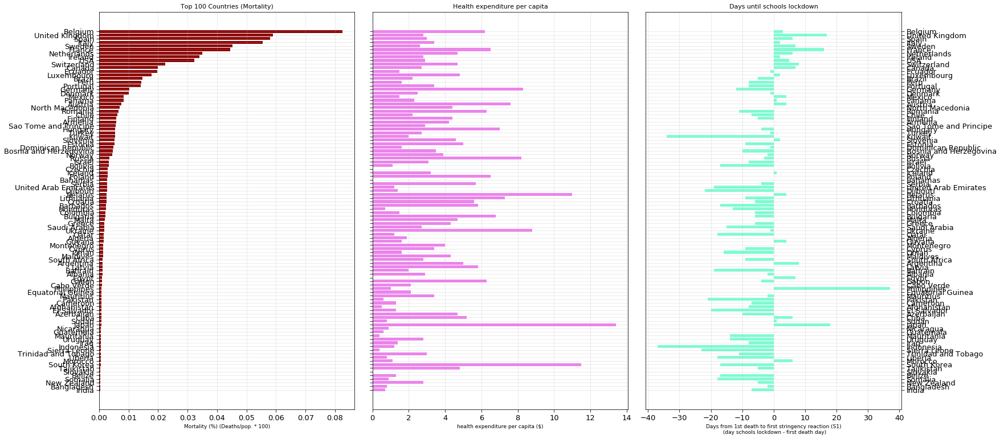

In [63]:
top = 100
indice = chucho["mortality"].index[-top:]
dias_primer_caso = [dateFirst(country,df_deaths,0) for country in indice.tolist()]
dias_primera_accion = [dateS1(country,df_stringency) for country in indice.tolist()]

df_actuacion = pd.DataFrame({'country':indice.tolist(),
              'first_case':dias_primer_caso,
              'first_measure':dias_primera_accion})

df_actuacion['dias_en_actuar'] = df_actuacion['first_measure'] - df_actuacion['first_case']
#df_actuacion = df_actuacion.replace({pd.np.nan: None})

df_actuacion['dias_en_actuar'] = df_actuacion['dias_en_actuar'].apply(lambda x: x.days)


f = plt.figure(figsize=(20,10))
ax1 = f.add_subplot(131)
ax2 = f.add_subplot(132)
ax3 = f.add_subplot(133)

f.tight_layout(pad=0.05)



#ax1.axes(axisbelow=True)
ax1.barh(chucho["mortality"].index[-top:],chucho["mortality"].values[-top:],color="darkred")
ax1.tick_params(size=5,labelsize = 13)
ax1.set_xlabel("Mortality (%) (Deaths/pop. * 100)",fontsize=9)
ax1.set_title("Top {} Countries (Mortality)".format(top),fontsize=11)
ax1.grid(alpha=0.3,which='both')
#plt.savefig(out+'Top 10 Countries (Mortality).png')

beds = df_beds.copy()
beds.index = beds.country

datos_camas = beds.loc[chucho["mortality"].index[-top:].tolist(),:]

#plt.axes(axisbelow=True)
ax2.barh(datos_camas['last_data'].index[-top:],datos_camas['last_data'].values[-top:],color="violet")
ax2.tick_params(size=5,labelsize = 13)
ax2.set_xlabel("health expenditure per capita ($)",fontsize=9)
ax2.set_title("Health expenditure per capita",fontsize=11)
ax2.set_yticklabels([])
ax2.grid(alpha=0.3,which='both')

#plt.axes(axisbelow=True)
ax3.barh(df_actuacion.country,df_actuacion.fillna(0).dias_en_actuar,color="aquamarine")
ax3.tick_params(size=5,labelsize = 13)
ax3.set_xlabel("Days from 1st death to first stringency reaction (S1)\n (day schools lockdown - first death day)",fontsize=9)
ax3.set_title("Days until schools lockdown",fontsize=11)
ax3.yaxis.tick_right()
ax3.grid(alpha=0.3,which='both')

plt.savefig('mortality and health and reaction.png')

## Deaths comparison only Europe

In [64]:
muertes = pd.DataFrame(df_countries_cases['Deaths']).reset_index().copy()
muertes.index = muertes['country']
muertes = muertes.drop(columns =['country'])
compare_muertes = pd.concat([muertes, population.drop(columns =['country'])], axis=1, join='inner')
compare_muertes = compare_muertes.reset_index()
compare_muertes['deaths100k'] = compare_muertes['Deaths']/(compare_muertes['PopTotal']*1000)*100000
compare_muertes['mortality'] = compare_muertes['Deaths']/(compare_muertes['PopTotal']*1000)*100

In [65]:
inversion_salud = df_health.copy()
inversion_salud.index = health.country
inversion_salud = inversion_salud.rename(columns={'2017':'health_capita'})
inversion_salud = inversion_salud.drop(columns=['country'])


In [66]:
compare_muertes = inversion_salud.merge(compare_muertes, left_on='country', right_on='country')

In [67]:
camas_mil = df_beds.copy()
camas_mil = camas_mil.drop(columns=['Country Code'])
camas_mil = camas_mil.rename(columns={'last_data':'beds_last_data', 'last_year':'beds_last_year'})

In [68]:
compare_muertes = camas_mil.merge(compare_muertes, left_on='country', right_on='country')

In [69]:
compare_muertes = df_healthgdp[['country','last_hgdp_data','last_hgdp_year']].merge(compare_muertes, left_on='country', right_on='country')

In [70]:
indice = chucho["mortality"].index
dias_primer_muerte = [dateFirst(country,df_deaths,0) for country in indice.tolist()]
dias_primer_50casos = [dateFirst(country,df_confirmed,49) for country in indice.tolist()]
dias_primera_accion = [dateS1(country,df_stringency) for country in indice.tolist()]
df_actuacion = pd.DataFrame({'country':indice.tolist(),
              'first_death':dias_primer_muerte,
              '50first_confirmed':dias_primer_50casos,
              'first_measure':dias_primera_accion})
df_actuacion['dias_en_actuar_d'] = df_actuacion['first_measure'] - df_actuacion['first_death']
#df_actuacion = df_actuacion.replace({pd.np.nan: None})
df_actuacion['dias_en_actuar_d'] = df_actuacion['dias_en_actuar_d'].apply(lambda x: x.days)

df_actuacion['dias_en_actuar_50c'] = df_actuacion['first_measure'] - df_actuacion['50first_confirmed']
df_actuacion['dias_en_actuar_50c'] = df_actuacion['dias_en_actuar_50c'].apply(lambda x: x.days)

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with

In [71]:
compare_muertes = df_actuacion.merge(compare_muertes, left_on='country', right_on='country')

In [72]:
compare_muertes.head()

,country,first_death,50first_confirmed,first_measure,dias_en_actuar_d,dias_en_actuar_50c,last_hgdp_data,last_hgdp_year,beds_last_data,beds_last_year,Country Code,health_capita,Deaths,PopTotal,PopDensity,deaths100k,mortality
0,Eritrea,NaT,NaT,NaT,NaN,NaN,2.87002,2017,0.7,2011,ERI,32.911999,0.0,3497.117,34.625,0.0,0.0
1,Papua New Guinea,NaT,NaT,2020-03-23,NaN,NaN,2.46928,2017,4.0242,1990,PNG,61.457840,0.0,8776.119,19.379,0.0,0.0
2,Namibia,NaT,NaT,2020-03-17,NaN,NaN,8.55096,2017,2.7,2009,NAM,447.280640,0.0,2494.524,3.030,0.0,0.0
3,Mongolia,NaT,2020-05-14,2020-01-27,NaN,-108.0,4.0023,2017,7,2012,MNG,148.784454,0.0,3225.166,2.076,0.0,0.0
4,Lesotho,NaT,NaT,2020-03-18,NaN,NaN,8.76316,2017,1.3,2006,LSO,104.552795,0.0,2125.267,70.002,0.0,0.0


#### Europe

In [73]:
paises = np.asarray(compare_muertes["country"])
compare_muertes.insert(2,"continent", [continents[country_to_continent_code(country)] for country in paises[:]])

In [74]:
compare_muertes_europe = compare_muertes[compare_muertes['continent'] == 'Europe']
compare_muertes_europe = df_acutebeds[['country','acute_beds']].merge(compare_muertes_europe, on='country')
print(compare_muertes_europe.shape)
compare_muertes_europe = compare_muertes_europe.sort_values(by='mortality')
compare_muertes_europe.head(5)

(29, 19)


,country,acute_beds,first_death,continent,50first_confirmed,first_measure,dias_en_actuar_d,dias_en_actuar_50c,last_hgdp_data,last_hgdp_year,beds_last_data,beds_last_year,Country Code,health_capita,Deaths,PopTotal,PopDensity,deaths100k,mortality
17,Latvia,329.88,2020-04-03,Europe,2020-03-18,NaT,NaN,NaN,5.95566,2017,5.8,2013,LVA,930.352356,24.0,1906.740,30.655,1.258693,0.001259
19,Malta,317.52,2020-04-08,Europe,2020-03-19,NaT,NaN,NaN,9.341,2017,4.7,2014,MLT,2585.563965,9.0,440.377,1376.178,2.043703,0.002044
2,Bulgaria,616.82,2020-03-11,Europe,2020-03-15,2020-03-05,-6.0,-10.0,8.0956,2017,6.8,2013,BGR,663.715088,146.0,7000.117,64.482,2.085679,0.002086
10,Croatia,350.50,2020-03-19,Europe,2020-03-16,2020-03-13,-6.0,-3.0,6.78913,2017,5.6,2015,HRV,902.139648,103.0,4130.299,73.808,2.493766,0.002494
15,Lithuania,547.20,2020-03-21,Europe,2020-03-21,2020-03-12,-9.0,-9.0,6.45756,2017,7.3,2013,LTU,1078.179199,71.0,2759.631,44.032,2.572808,0.002573


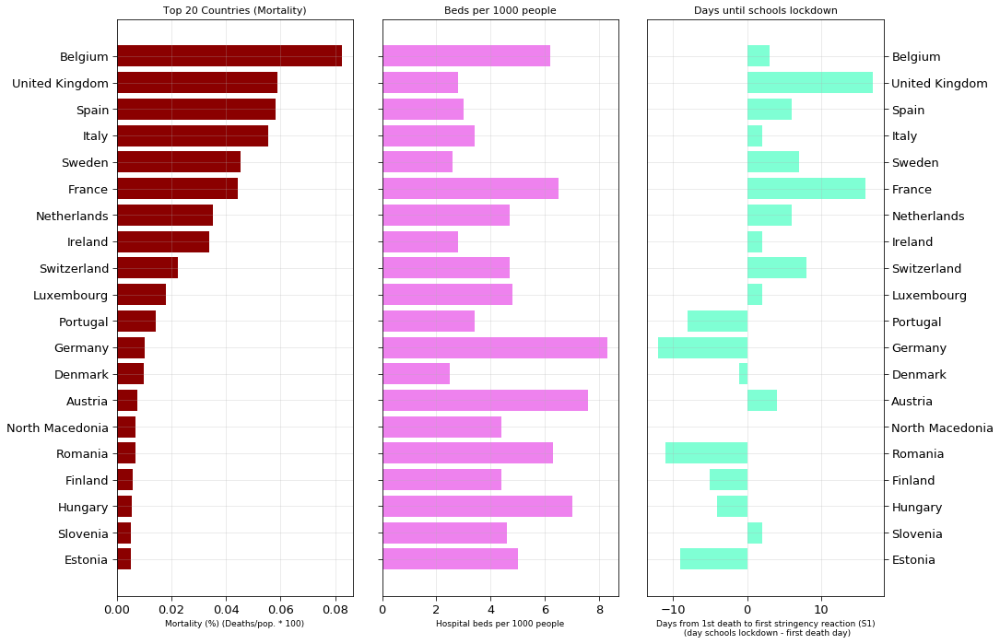

In [75]:
top = 20
f = plt.figure(figsize=(12,9))
ax1 = f.add_subplot(131)
ax2 = f.add_subplot(132)
ax3 = f.add_subplot(133)

f.tight_layout(pad=0.05)

#ax1.axes(axisbelow=True)
ax1.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.mortality.values[-top:],color="darkred")
ax1.tick_params(size=5,labelsize = 13)
ax1.set_xlabel("Mortality (%) (Deaths/pop. * 100)",fontsize=9)
ax1.set_title("Top {} Countries (Mortality)".format(top),fontsize=11)
ax1.grid(alpha=0.3,which='both')
#plt.savefig(out+'Top 10 Countries (Mortality).png')

#plt.axes(axisbelow=True)
ax2.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.beds_last_data.values[-top:],color="violet")
ax2.tick_params(size=5,labelsize = 13)
ax2.set_xlabel("Hospital beds per 1000 people",fontsize=9)
ax2.set_title("Beds per 1000 people",fontsize=11)
#ax2.set_xlabel("health expenditure per capita ($)",fontsize=9)
#ax2.set_title("Health expenditure per capita",fontsize=11)
ax2.set_yticklabels([])
ax2.grid(alpha=0.3,which='both')

#plt.axes(axisbelow=True)
ax3.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.dias_en_actuar_d.values[-top:],color="aquamarine")
ax3.tick_params(size=5,labelsize = 13)
ax3.set_xlabel("Days from 1st death to first stringency reaction (S1)\n (day schools lockdown - first death day)",fontsize=9)
ax3.set_title("Days until schools lockdown",fontsize=11)
ax3.yaxis.tick_right()
ax3.grid(alpha=0.3,which='both')

plt.savefig('mortality and health and reaction.png')

d:\program files\python37\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning:


Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


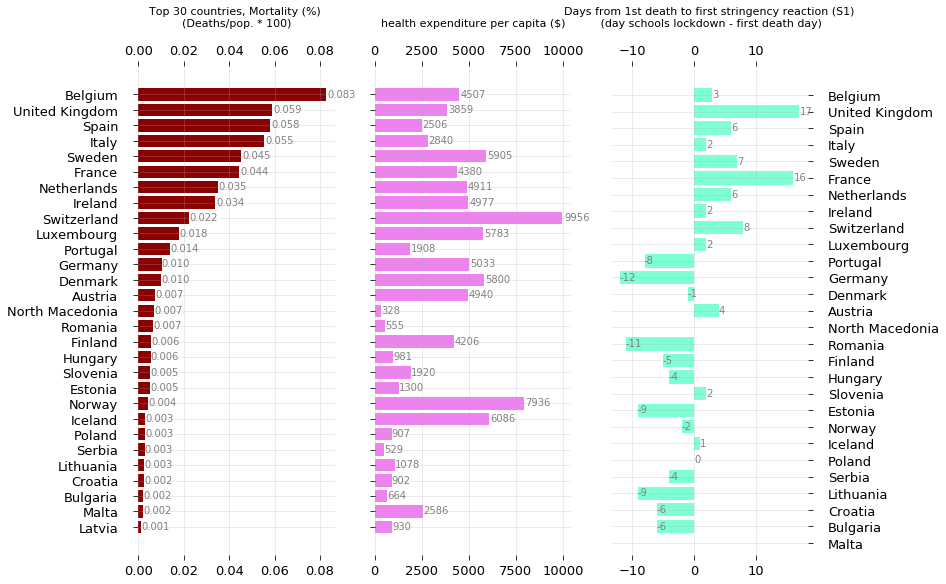

In [76]:
top = 30
f = plt.figure(figsize=(12,9))
ax1 = f.add_subplot(131)
ax2 = f.add_subplot(132)
ax3 = f.add_subplot(133)

#f.tight_layout(pad=0.05)

padtitle = 40 

#ax1.axes(axisbelow=True)
ax1.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.mortality.values[-top:],color="darkred")
ax1.tick_params(size=5,labelsize = 13)
ax1.set_title("Top {} countries, Mortality (%) \n(Deaths/pop. * 100)".format(top),fontsize=11, pad=padtitle)
#ax1.set_title("Top {} Countries (Mortality)".format(top),fontsize=11)
ax1.grid(alpha=0.3,which='both')
ax1.spines['bottom'].set_linewidth(0)
ax1.spines['top'].set_linewidth(0)
ax1.spines['right'].set_linewidth(0)
ax1.spines['left'].set_linewidth(0)
for i in ax1.patches:
    ax1.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.3f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax1.xaxis.set_tick_params(labeltop='on',top=True)
ax1.tick_params(axis="y", pad=15)
#plt.savefig(out+'Top 10 Countries (Mortality).png')

#plt.axes(axisbelow=True)
ax2.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.health_capita.values[-top:],color="violet")
ax2.tick_params(size=5,labelsize = 13)
#ax2.set_xlabel("Hospital beds per 1000 people",fontsize=9)
#ax2.set_title("Beds per 1000 people",fontsize=11)
ax2.set_title("health expenditure per capita ($)",fontsize=11, pad=padtitle)
#ax2.set_title("Health expenditure per capita",fontsize=11)
ax2.set_yticklabels([])
ax2.grid(alpha=0.3,which='both')
ax2.spines['bottom'].set_linewidth(0)
ax2.spines['top'].set_linewidth(0)
ax2.spines['right'].set_linewidth(0)
ax2.spines['left'].set_linewidth(0)
for i in ax2.patches:
    ax2.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.0f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax2.xaxis.set_tick_params(labeltop='on',top=True)

#plt.axes(axisbelow=True)
ax3.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.dias_en_actuar_d.values[-top:],color="aquamarine")
ax3.tick_params(size=5,labelsize = 13)
ax3.set_title("Days from 1st death to first stringency reaction (S1)\n (day schools lockdown - first death day)",
              fontsize=11, pad=padtitle)
#ax3.set_title("Days until schools lockdown",fontsize=11)
ax3.yaxis.tick_right()
ax3.grid(alpha=0.3,which='both')
ax3.spines['bottom'].set_linewidth(0)
ax3.spines['top'].set_linewidth(0)
ax3.spines['right'].set_linewidth(0)
ax3.spines['left'].set_linewidth(0)
for i in ax3.patches:
    ax3.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.0f}".format(i.get_width()), 
            fontsize=10,
            color='gray')

ax3.xaxis.set_tick_params(labeltop='on',top=True)
ax3.tick_params(axis="y", pad=15)


plt.savefig('mortality and health and reaction.png')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


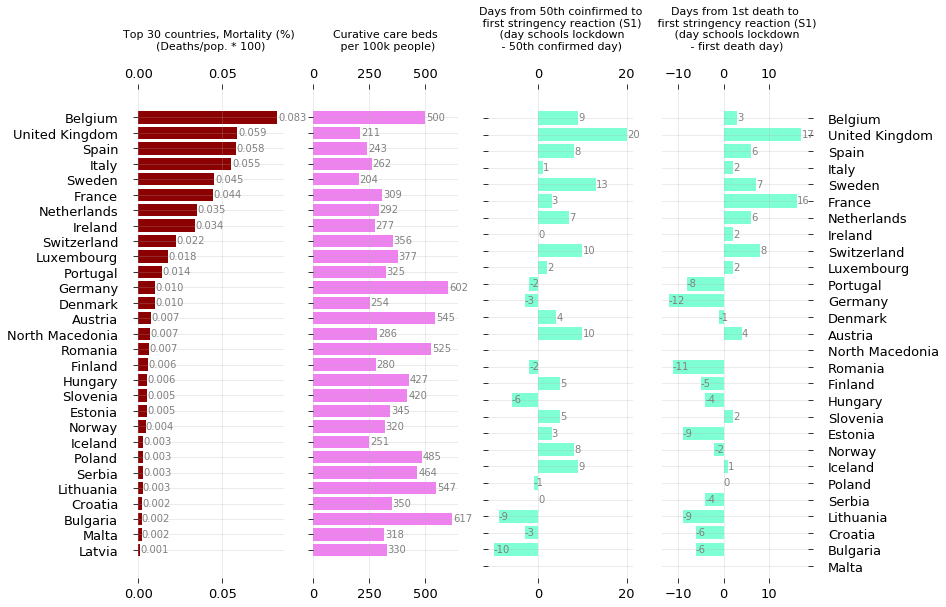

In [77]:
top = 30
f = plt.figure(figsize=(12,9))
ax1 = f.add_subplot(141)
ax2 = f.add_subplot(142)
ax3 = f.add_subplot(143)
ax4 = f.add_subplot(144)

#f.tight_layout(pad=0.05)

padtitle = 40 

#ax1.axes(axisbelow=True)
ax1.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.mortality.values[-top:],color="darkred")
ax1.tick_params(size=5,labelsize = 13)
ax1.set_title("Top {} countries, Mortality (%) \n(Deaths/pop. * 100)".format(top),fontsize=11, pad=padtitle)
#ax1.set_title("Top {} Countries (Mortality)".format(top),fontsize=11)
ax1.grid(alpha=0.3,which='both')
ax1.spines['bottom'].set_linewidth(0)
ax1.spines['top'].set_linewidth(0)
ax1.spines['right'].set_linewidth(0)
ax1.spines['left'].set_linewidth(0)
for i in ax1.patches:
    ax1.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.3f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax1.xaxis.set_tick_params(labeltop='on',top=True)
ax1.tick_params(axis="y", pad=15)
#plt.savefig(out+'Top 10 Countries (Mortality).png')

#plt.axes(axisbelow=True)
ax2.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.acute_beds.values[-top:],color="violet")
ax2.tick_params(size=5,labelsize = 13)
#ax2.set_xlabel("Hospital beds per 1000 people",fontsize=9)
#ax2.set_title("Beds per 1000 people",fontsize=11)
ax2.set_title("Curative care beds\n per 100k people)",fontsize=11, pad=padtitle)
#ax2.set_title("Health expenditure per capita",fontsize=11)
ax2.set_yticklabels([])
ax2.grid(alpha=0.3,which='both')
ax2.spines['bottom'].set_linewidth(0)
ax2.spines['top'].set_linewidth(0)
ax2.spines['right'].set_linewidth(0)
ax2.spines['left'].set_linewidth(0)
for i in ax2.patches:
    ax2.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.0f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax2.xaxis.set_tick_params(labeltop='on',top=True)

#plt.axes(axisbelow=True)
ax3.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.dias_en_actuar_50c.values[-top:],
         color="aquamarine")
ax3.tick_params(size=5,labelsize = 13)
#ax2.set_xlabel("Hospital beds per 1000 people",fontsize=9)
#ax3.set_title("Beds per 1000 people",fontsize=11)
ax3.set_title("Days from 50th coinfirmed to\n first stringency reaction (S1)\n (day schools lockdown\n - 50th confirmed day)"
              ,fontsize=11, pad=padtitle)
#ax2.set_title("Health expenditure per capita",fontsize=11)
ax3.set_yticklabels([])
ax3.grid(alpha=0.3,which='both')
ax3.spines['bottom'].set_linewidth(0)
ax3.spines['top'].set_linewidth(0)
ax3.spines['right'].set_linewidth(0)
ax3.spines['left'].set_linewidth(0)
for i in ax3.patches:
    ax3.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.0f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax3.xaxis.set_tick_params(labeltop='on',top=True)

#plt.axes(axisbelow=True)
ax4.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.dias_en_actuar_d.values[-top:]
         ,color="aquamarine")
ax4.tick_params(size=5,labelsize = 13)
ax4.set_title("Days from 1st death to\n first stringency reaction (S1)\n (day schools lockdown\n - first death day)",
              fontsize=11, pad=padtitle)
#ax3.set_title("Days until schools lockdown",fontsize=11)
ax4.yaxis.tick_right()
ax4.grid(alpha=0.3,which='both')
ax4.spines['bottom'].set_linewidth(0)
ax4.spines['top'].set_linewidth(0)
ax4.spines['right'].set_linewidth(0)
ax4.spines['left'].set_linewidth(0)
for i in ax4.patches:
    ax4.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.0f}".format(i.get_width()), 
            fontsize=10,
            color='gray')

ax4.xaxis.set_tick_params(labeltop='on',top=True)
ax4.tick_params(axis="y", pad=15)



plt.savefig('mortality and health and reaction.png')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


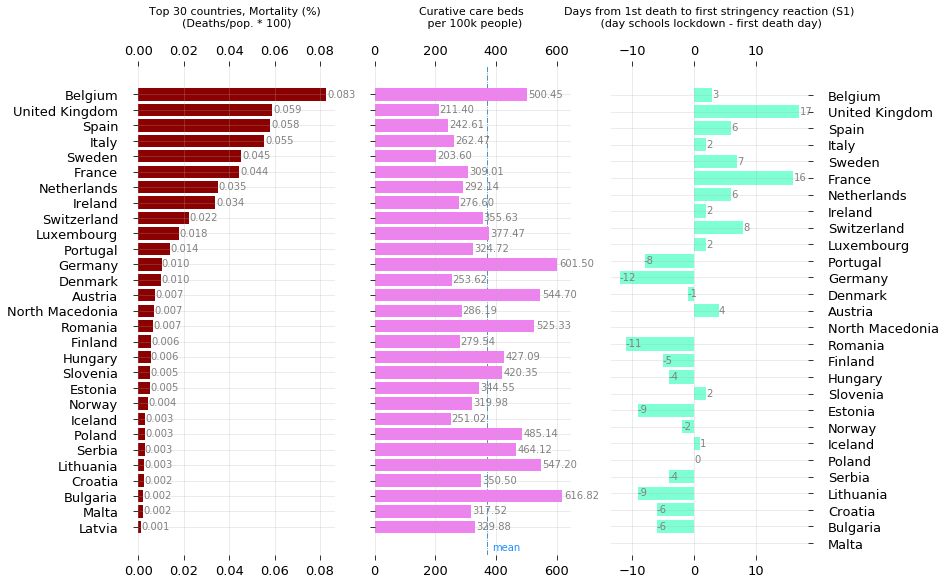

In [78]:
top = 30
f = plt.figure(figsize=(12,9))
ax1 = f.add_subplot(131)
ax2 = f.add_subplot(132)
ax3 = f.add_subplot(133)

#f.tight_layout(pad=0.05)

padtitle = 40 

#ax1.axes(axisbelow=True)
ax1.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.mortality.values[-top:],color="darkred")
ax1.tick_params(size=5,labelsize = 13)
ax1.set_title("Top {} countries, Mortality (%) \n(Deaths/pop. * 100)".format(top),fontsize=11, pad=padtitle)
#ax1.set_title("Top {} Countries (Mortality)".format(top),fontsize=11)
ax1.grid(alpha=0.3,which='both')
ax1.spines['bottom'].set_linewidth(0)
ax1.spines['top'].set_linewidth(0)
ax1.spines['right'].set_linewidth(0)
ax1.spines['left'].set_linewidth(0)
for i in ax1.patches:
    ax1.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.3f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax1.xaxis.set_tick_params(labeltop='on',top=True)
ax1.tick_params(axis="y", pad=15)
#plt.savefig(out+'Top 10 Countries (Mortality).png')

#plt.axes(axisbelow=True)
ax2.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.acute_beds.values[-top:],color="violet")
ax2.tick_params(size=5,labelsize = 13)
#ax2.set_xlabel("Hospital beds per 1000 people",fontsize=9)
#ax2.set_title("Beds per 1000 people",fontsize=11)
ax2.set_title("Curative care beds \n per 100k people)",fontsize=11, pad=padtitle)
ax2.set_yticklabels([])
ax2.grid(alpha=0.3,which='both')
ax2.spines['bottom'].set_linewidth(0)
ax2.spines['top'].set_linewidth(0)
ax2.spines['right'].set_linewidth(0)
ax2.spines['left'].set_linewidth(0)
for i in ax2.patches:
    ax2.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.2f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax2.xaxis.set_tick_params(labeltop='on',top=True)
media = np.array([i.get_width() for i in ax2.patches]).mean()
ax2.axvline(x=media,
            ls='-.', 
            lw=0.8,
            zorder = 0)
ax2.text(media + media*0.05,-1.5,'mean',rotation=0,color='dodgerblue')

#plt.axes(axisbelow=True)
ax3.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.dias_en_actuar_d.values[-top:],color="aquamarine")
ax3.tick_params(size=5,labelsize = 13)
ax3.set_title("Days from 1st death to first stringency reaction (S1)\n (day schools lockdown - first death day)",
              fontsize=11, pad=padtitle)
#ax3.set_title("Days until schools lockdown",fontsize=11)
ax3.yaxis.tick_right()
ax3.grid(alpha=0.3,which='both')
ax3.spines['bottom'].set_linewidth(0)
ax3.spines['top'].set_linewidth(0)
ax3.spines['right'].set_linewidth(0)
ax3.spines['left'].set_linewidth(0)
for i in ax3.patches:
    ax3.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.0f}".format(i.get_width()), 
            fontsize=10,
            color='gray')

ax3.xaxis.set_tick_params(labeltop='on',top=True)
ax3.tick_params(axis="y", pad=15)


plt.savefig('mortality and health and reaction.png')

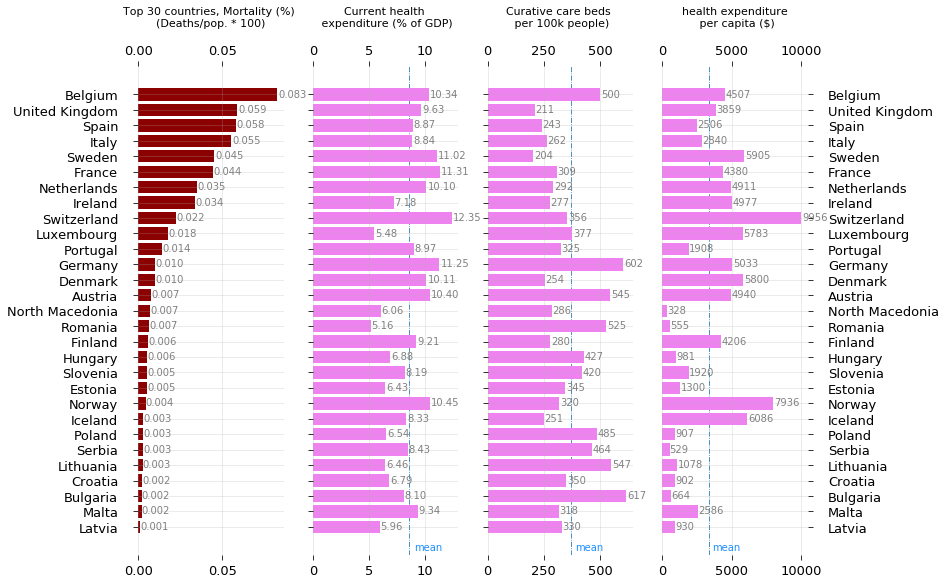

In [79]:
top = 30
f = plt.figure(figsize=(12,9))
ax1 = f.add_subplot(141)
ax2 = f.add_subplot(142)
ax3 = f.add_subplot(143)
ax4 = f.add_subplot(144)

#f.tight_layout(pad=0.05)

padtitle = 40 

#ax1.axes(axisbelow=True)
ax1.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.mortality.values[-top:],color="darkred")
ax1.tick_params(size=5,labelsize = 13)
ax1.set_title("Top {} countries, Mortality (%) \n(Deaths/pop. * 100)".format(top),fontsize=11, pad=padtitle)
#ax1.set_title("Top {} Countries (Mortality)".format(top),fontsize=11)
ax1.grid(alpha=0.3,which='both')
ax1.spines['bottom'].set_linewidth(0)
ax1.spines['top'].set_linewidth(0)
ax1.spines['right'].set_linewidth(0)
ax1.spines['left'].set_linewidth(0)
for i in ax1.patches:
    ax1.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.3f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax1.xaxis.set_tick_params(labeltop='on',top=True)
ax1.tick_params(axis="y", pad=15)
#plt.savefig(out+'Top 10 Countries (Mortality).png')

#plt.axes(axisbelow=True)
ax2.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.last_hgdp_data.values[-top:],color="violet")
ax2.tick_params(size=5,labelsize = 13)
#ax2.set_xlabel("Hospital beds per 1000 people",fontsize=9)
#ax2.set_title("Beds per 1000 people",fontsize=11)
ax2.set_title("Current health \n expenditure (% of GDP)",fontsize=11, pad=padtitle)
#ax2.set_title("Health expenditure per capita",fontsize=11)
ax2.set_yticklabels([])
ax2.grid(alpha=0.3,which='both')
ax2.spines['bottom'].set_linewidth(0)
ax2.spines['top'].set_linewidth(0)
ax2.spines['right'].set_linewidth(0)
ax2.spines['left'].set_linewidth(0)
for i in ax2.patches:
    ax2.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.2f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax2.xaxis.set_tick_params(labeltop='on',top=True)
media = np.array([i.get_width() for i in ax2.patches]).mean()
ax2.axvline(x=media,
            ls='-.', 
            lw=0.8,
            zorder = 0)
ax2.text(media + media*0.05,-1.5,'mean',rotation=0,color='dodgerblue')

#plt.axes(axisbelow=True)
ax3.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.acute_beds.values[-top:],color="violet")
ax3.tick_params(size=5,labelsize = 13)
#ax2.set_xlabel("Hospital beds per 1000 people",fontsize=9)
#ax2.set_title("Beds per 1000 people",fontsize=11)
ax3.set_title("Curative care beds \n per 100k people)",fontsize=11, pad=padtitle)
#ax2.set_title("Health expenditure per capita",fontsize=11)
ax3.set_yticklabels([])
ax3.grid(alpha=0.3,which='both')
ax3.spines['bottom'].set_linewidth(0)
ax3.spines['top'].set_linewidth(0)
ax3.spines['right'].set_linewidth(0)
ax3.spines['left'].set_linewidth(0)
for i in ax3.patches:
    ax3.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.0f}".format(i.get_width()), 
            fontsize=10,
            color='gray')
    
ax3.xaxis.set_tick_params(labeltop='on',top=True)
media = np.array([i.get_width() for i in ax3.patches]).mean()
ax3.axvline(x=media,
            ls='-.', 
            lw=0.8,
            zorder = 0)
ax3.text(media + media*0.05,-1.5,'mean',rotation=0,color='dodgerblue')


#plt.axes(axisbelow=True)
ax4.barh(compare_muertes_europe.country.values[-top:],compare_muertes_europe.health_capita.values[-top:],color="violet")
ax4.tick_params(size=5,labelsize = 13)
ax4.set_title("health expenditure\n per capita ($)",fontsize=11, pad=padtitle)
#ax3.set_title("Days until schools lockdown",fontsize=11)
ax4.yaxis.tick_right()
ax4.grid(alpha=0.3,which='both')
ax4.spines['bottom'].set_linewidth(0)
ax4.spines['top'].set_linewidth(0)
ax4.spines['right'].set_linewidth(0)
ax4.spines['left'].set_linewidth(0)
for i in ax4.patches:
    ax4.text(i.get_width()+i.get_width()*0.01, i.get_y()+0.25, "{:.0f}".format(i.get_width()), 
            fontsize=10,
            color='gray')

ax4.xaxis.set_tick_params(labeltop='on',top=True)
ax4.tick_params(axis="y", pad=15)
media = np.array([i.get_width() for i in ax4.patches]).mean()
ax4.axvline(x=media,
            ls='-.', 
            lw=0.8,
            zorder = 0)
ax4.text(media + media*0.05,-1.5,'mean',rotation=0,color='dodgerblue')


plt.savefig('mortality and health and reaction.png')

In [80]:
np.array([i.get_width() for i in ax3.patches]).mean()

369.6948275862069

In [81]:
muertes_europe_cor = compare_muertes_europe[['dias_en_actuar_d',
                                             'dias_en_actuar_50c',
                                             'health_capita',
                                             'PopDensity',
                                             'beds_last_data',
                                             'acute_beds',
                                             'last_hgdp_data',
                                             'mortality']].astype({'beds_last_data':'float64',
                                                                   'last_hgdp_data':'float64'})
muertes_europe_cor.corr().style.background_gradient(cmap='Reds')

,dias_en_actuar_d,dias_en_actuar_50c,health_capita,PopDensity,beds_last_data,acute_beds,last_hgdp_data,mortality
dias_en_actuar_d,1,0.721024,0.456078,0.353251,-0.378759,-0.529414,0.488008,0.652298
dias_en_actuar_50c,0.721024,1,0.604656,0.258207,-0.533937,-0.58457,0.54302,0.519018
health_capita,0.456078,0.604656,1,0.0579988,-0.328205,-0.306073,0.694851,0.285948
PopDensity,0.353251,0.258207,0.0579988,1,-0.000482332,-0.0533182,0.217078,0.109452
beds_last_data,-0.378759,-0.533937,-0.328205,-0.000482332,1,0.87186,-0.135537,-0.329227
acute_beds,-0.529414,-0.58457,-0.306073,-0.0533182,0.87186,1,-0.159907,-0.334772
last_hgdp_data,0.488008,0.54302,0.694851,0.217078,-0.135537,-0.159907,1,0.412571
mortality,0.652298,0.519018,0.285948,0.109452,-0.329227,-0.334772,0.412571,1


In [82]:
compare_muertes_europe

,country,acute_beds,first_death,continent,50first_confirmed,first_measure,dias_en_actuar_d,dias_en_actuar_50c,last_hgdp_data,last_hgdp_year,beds_last_data,beds_last_year,Country Code,health_capita,Deaths,PopTotal,PopDensity,deaths100k,mortality
17,Latvia,329.88,2020-04-03,Europe,2020-03-18,NaT,NaN,NaN,5.95566,2017,5.8,2013,LVA,930.352356,24.0,1906.740,30.655,1.258693,0.001259
19,Malta,317.52,2020-04-08,Europe,2020-03-19,NaT,NaN,NaN,9.341,2017,4.7,2014,MLT,2585.563965,9.0,440.377,1376.178,2.043703,0.002044
2,Bulgaria,616.82,2020-03-11,Europe,2020-03-15,2020-03-05,-6.0,-10.0,8.0956,2017,6.8,2013,BGR,663.715088,146.0,7000.117,64.482,2.085679,0.002086
10,Croatia,350.50,2020-03-19,Europe,2020-03-16,2020-03-13,-6.0,-3.0,6.78913,2017,5.6,2015,HRV,902.139648,103.0,4130.299,73.808,2.493766,0.002494
15,Lithuania,547.20,2020-03-21,Europe,2020-03-21,2020-03-12,-9.0,-9.0,6.45756,2017,7.3,2013,LTU,1078.179199,71.0,2759.631,44.032,2.572808,0.002573
25,Serbia,464.12,2020-03-20,Europe,2020-03-16,2020-03-16,-4.0,0.0,8.43396,2017,5.7,2012,SRB,528.545166,245.0,8772.228,100.300,2.792905,0.002793
22,Poland,485.14,2020-03-12,Europe,2020-03-13,2020-03-12,0.0,-1.0,6.54195,2017,6.5,2013,POL,906.820129,1115.0,37887.771,123.723,2.942902,0.002943
13,Iceland,251.02,2020-03-15,Europe,2020-03-07,2020-03-16,1.0,9.0,8.32629,2017,3.2,2014,ISL,6086.311523,10.0,339.037,3.382,2.949531,0.002950
21,Norway,319.98,2020-03-14,Europe,2020-03-04,2020-03-12,-2.0,8.0,10.4463,2017,3.9,2013,NOR,7936.375000,237.0,5378.859,14.726,4.406139,0.004406
6,Estonia,344.55,2020-03-25,Europe,2020-03-13,2020-03-16,-9.0,3.0,6.42936,2017,5,2015,EST,1300.481689,69.0,1325.649,31.273,5.204998,0.005205


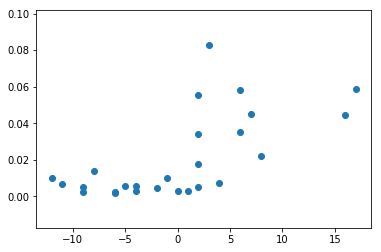

In [83]:
plt.scatter(compare_muertes_europe['dias_en_actuar_d'],compare_muertes_europe['mortality'])

In [84]:
fig = px.scatter(compare_muertes_europe, y=compare_muertes_europe["mortality"],
                    x= compare_muertes_europe["dias_en_actuar_d"],
                    text="country",
                    hover_name="country",
                    hover_data=["acute_beds","Deaths"],
                    range_color= [0, max(np.power(compare_muertes_europe["Deaths"],0.3))], 
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title='Mortalidad COVID-19 vs tiempo de reacción',
                    size_max = 30,
                    height =500
                    )
fig.update_traces(textposition='top center')
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.update_xaxes(title_text="Dias desde el primer fallecido hasta cerrar los colegios")
fig.update_yaxes(title_text="Mortality (%)")
fig.update_layout(
    title="Mortalidad COVID-19 vs tiempo de reacción",
    xaxis_title="Dias desde el primer fallecido hasta cerrar los colegios",
    yaxis_title="mortality (%)",
    font=dict(
        family="Arial",
        size=14,
        color="#7f7f7f"
    )
)
fig.show()

In [85]:
fig = px.scatter(compare_muertes_europe, y=compare_muertes_europe["mortality"],
                    x= compare_muertes_europe["acute_beds"],
                    text="country",
                    hover_name="country",
                    hover_data=["acute_beds","Deaths"],
                    range_color= [0, max(np.power(compare_muertes_europe["Deaths"],0.3))], 
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title='Mortalidad COVID-19 vs camas UCI',
                    size_max = 30,
                    height =500      
                    )
fig.update_traces(textposition='top center',textfont_size=14)
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.update_xaxes(title_text="Número de camas UCI")
fig.update_yaxes(title_text="mortality (%)")
fig.update_layout(
    title="Mortalidad COVID-19 vs camas UCI",
    xaxis_title="Número de camas UCI",
    yaxis_title="mortality (%)",
    font=dict(
        family="Arial",
        size=17,
        color="#7f7f7f"
    )
)
fig.show()

In [86]:
df_deaths.groupby(by=["country","continent"]).sum().reset_index()

,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20
0,Afghanistan,Asia,33.000000,65.000000,0,0,0,0,0,0,...,218,219,220,227,235,246,249,257,265,270
1,Albania,Europe,41.153300,20.168300,0,0,0,0,0,0,...,32,32,33,33,33,33,33,33,33,33
2,Algeria,Africa,28.033900,1.659600,0,0,0,0,0,0,...,600,609,617,623,630,638,646,653,661,667
3,Andorra,Europe,42.506300,1.521800,0,0,0,0,0,0,...,51,51,51,51,51,51,51,51,51,51
4,Angola,Africa,-11.202700,17.873900,0,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4
5,Antigua and Barbuda,North America,17.060800,-61.796400,0,0,0,0,0,0,...,3,3,3,3,3,3,3,3,3,3
6,Argentina,South America,-38.416100,-63.616700,0,0,0,0,0,0,...,452,467,484,500,508,520,528,539,556,569
7,Armenia,Asia,40.069100,45.038200,0,0,0,0,0,0,...,81,87,91,98,113,120,127,131,139,158
8,Australia,Australia,-255.969500,1129.862300,0,0,0,0,0,0,...,102,102,103,103,103,103,103,103,102,102
9,Austria,Europe,47.516200,14.550100,0,0,0,0,0,0,...,640,641,643,645,668,668,668,668,668,669


In [87]:
df_deaths

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20
0,,Afghanistan,Asia,33.000000,65.000000,0,0,0,0,0,...,218,219,220,227,235,246,249,257,265,270
1,,Albania,Europe,41.153300,20.168300,0,0,0,0,0,...,32,32,33,33,33,33,33,33,33,33
2,,Algeria,Africa,28.033900,1.659600,0,0,0,0,0,...,600,609,617,623,630,638,646,653,661,667
3,,Andorra,Europe,42.506300,1.521800,0,0,0,0,0,...,51,51,51,51,51,51,51,51,51,51
4,,Angola,Africa,-11.202700,17.873900,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4
5,,Antigua and Barbuda,North America,17.060800,-61.796400,0,0,0,0,0,...,3,3,3,3,3,3,3,3,3,3
6,,Argentina,South America,-38.416100,-63.616700,0,0,0,0,0,...,452,467,484,500,508,520,528,539,556,569
7,,Armenia,Asia,40.069100,45.038200,0,0,0,0,0,...,81,87,91,98,113,120,127,131,139,158
8,Australian Capital Territory,Australia,Australia,-35.473500,149.012400,0,0,0,0,0,...,3,3,3,3,3,3,3,3,3,3
9,New South Wales,Australia,Australia,-33.868800,151.209300,0,0,0,0,0,...,48,48,48,48,48,48,48,48,48,48


## Plot the evolution

In [88]:
datos_muertes_t = df_deaths.groupby(by=["country","continent"]).sum().reset_index()\
    .melt(id_vars=["country","continent", "Lat", "Long"], 
          var_name="Date", 
          value_name="ac_deaths")
datos_muertes_t['Date'] = datos_muertes_t['Date'].apply(lambda x: datetime.strptime(x, "%m/%d/%y"))
datos_muertes_t.sort_values(by='Date', inplace=True)
datos_muertes_t.drop(columns=["Lat","Long"], inplace=True)
datos_muertes_t.head(20)

,country,continent,Date,ac_deaths
0,Afghanistan,Asia,2020-01-22,0
120,Netherlands,Europe,2020-01-22,0
121,New Zealand,Australia,2020-01-22,0
122,Nicaragua,North America,2020-01-22,0
123,Niger,Africa,2020-01-22,0
124,Nigeria,Africa,2020-01-22,0
125,North Macedonia,Europe,2020-01-22,0
126,Norway,Europe,2020-01-22,0
127,Oman,Asia,2020-01-22,0
128,Pakistan,Asia,2020-01-22,0


In [89]:
muertes_t = datos_muertes_t.merge(population.drop(columns='country'), left_on='country', right_on='country')
muertes_t['deaths100k'] = muertes_t['ac_deaths']/(muertes_t['PopTotal']*1000) * 100000

muertes_t = muertes_t.sort_values(by='Date') # sort rows based on timestamp
muertes_t['timestamp'] = muertes_t.Date.apply(lambda x: x.date()).apply(str) # convert timestamp to a string

muertes_t.head()

,country,continent,Date,ac_deaths,PopTotal,PopDensity,deaths100k,timestamp
0,Afghanistan,Asia,2020-01-22,0,38041.757,58.269,0.0,2020-01-22
21413,Egypt,Africa,2020-01-22,0,100388.076,100.847,0.0,2020-01-22
2128,Portugal,Europe,2020-01-22,0,10226.178,111.652,0.0,2020-01-22
6384,Togo,Africa,2020-01-22,0,8082.359,148.600,0.0,2020-01-22
17157,Belgium,Europe,2020-01-22,0,11539.326,381.087,0.0,2020-01-22


In [96]:
fig = px.bar(muertes_t[(muertes_t.continent == 'Europe') & (muertes_t.PopTotal > 100) & (muertes_t.Date > "2020-03-01")], 
       x="deaths100k", 
       y="country", 
       text="deaths100k",
       #textposition='auto',
       orientation='h',
       animation_frame="timestamp",
       animation_group="PopTotal",
       color="country",
       template="simple_white",
       range_y=[26.5,37.5],
       range_x=[0,60])\
        .update_yaxes(categoryorder="total ascending")

fig.update_layout(title_text='Europe COVID-19 Mortality per 100k people')
fig.update_traces(texttemplate='%{text:.2f}', textposition='inside')
fig.update_xaxes(title_text="Top 10")
fig.update_yaxes(title_text="Mortality (per 100k)")
fig.update_layout(showlegend=False)
#fig.write_html(out+"mortality_animation.html")

In [97]:
compare_muertes_europe.sort_values(by='deaths100k')['country'].values[-20:]

array(['Estonia', 'Slovenia', 'Hungary', 'Finland', 'Romania',
       'North Macedonia', 'Austria', 'Denmark', 'Germany', 'Portugal',
       'Luxembourg', 'Switzerland', 'Ireland', 'Netherlands', 'France',
       'Sweden', 'Italy', 'Spain', 'United Kingdom', 'Belgium'],
      dtype=object)

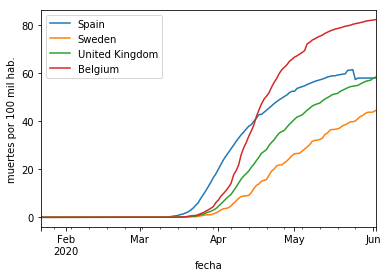

In [98]:
ax = muertes_t[muertes_t['country'] == 'Spain'][['Date','deaths100k']].plot(x='Date',y='deaths100k')
muertes_t[muertes_t['country'] == 'Sweden'][['Date','deaths100k']].plot(x='Date',y='deaths100k', ax=ax)
muertes_t[muertes_t['country'] == 'United Kingdom'][['Date','deaths100k']].plot(x='Date',y='deaths100k', ax=ax)
muertes_t[muertes_t['country'] == 'Belgium'][['Date','deaths100k']].plot(x='Date',y='deaths100k', ax=ax)

plt.ylabel("muertes por 100 mil hab.")
plt.xlabel("fecha")

ax.legend(["Spain", "Sweden", 'United Kingdom', 'Belgium'])

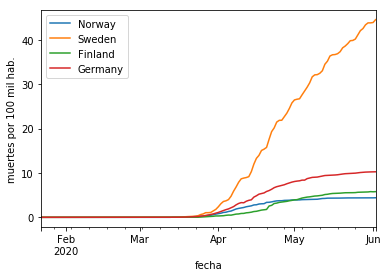

In [93]:
ax = muertes_t[muertes_t['country'] == 'Norway'][['Date','deaths100k']].plot(x='Date',y='deaths100k')
muertes_t[muertes_t['country'] == 'Sweden'][['Date','deaths100k']].plot(x='Date',y='deaths100k', ax=ax)
muertes_t[muertes_t['country'] == 'Finland'][['Date','deaths100k']].plot(x='Date',y='deaths100k', ax=ax)
muertes_t[muertes_t['country'] == 'Germany'][['Date','deaths100k']].plot(x='Date',y='deaths100k', ax=ax)

plt.ylabel("muertes por 100 mil hab.")
plt.xlabel("fecha")

ax.legend(["Norway", "Sweden", 'Finland', 'Germany'])

In [94]:
muertes_t[muertes_t['continent']=='Europe'].to_csv('muertes_t.csv')

In [95]:
pd.read_csv('muertes_t.csv',index_col=[0])

,country,continent,Date,ac_deaths,PopTotal,PopDensity,deaths100k,timestamp
2128,Portugal,Europe,2020-01-22,0,10226.178,111.652,0.000000,2020-01-22
17157,Belgium,Europe,2020-01-22,0,11539.326,381.087,0.000000,2020-01-22
9443,Serbia,Europe,2020-01-22,0,8772.228,100.300,0.000000,2020-01-22
5187,Monaco,Europe,2020-01-22,0,38.967,26152.349,0.000000,2020-01-22
1995,Poland,Europe,2020-01-22,0,37887.771,123.723,0.000000,2020-01-22
3591,Liechtenstein,Europe,2020-01-22,0,38.020,237.625,0.000000,2020-01-22
15428,Andorra,Europe,2020-01-22,0,77.146,164.140,0.000000,2020-01-22
13965,Croatia,Europe,2020-01-22,0,4130.299,73.808,0.000000,2020-01-22
17024,Belarus,Europe,2020-01-22,0,9452.409,46.584,0.000000,2020-01-22
14364,Czechia,Europe,2020-01-22,0,10689.213,138.390,0.000000,2020-01-22


## Analisis con respecto a muertes totales en españa

In [99]:
#datos de muertes totales del ministerio
df_momo = pd.read_csv('https://momo.isciii.es/public/momo/data') 

In [100]:
df_momo = df_momo[df_momo.ambito == 'nacional']
df_momo = df_momo.iloc[:,4:]
print(df_momo.shape)
df_momo.head()

(8988, 11)


,cod_sexo,nombre_sexo,cod_gedad,nombre_gedad,fecha_defuncion,defunciones_observadas,defunciones_observadas_lim_inf,defunciones_observadas_lim_sup,defunciones_esperadas,defunciones_esperadas_q01,defunciones_esperadas_q99
0,all,todos,all,todos,2018-05-16,1035,1035.0,1035.0,1038.0,959.535,1141.31
1,all,todos,all,todos,2018-05-17,1058,1058.0,1058.0,1038.0,959.535,1141.31
2,all,todos,all,todos,2018-05-18,1058,1058.0,1058.0,1038.0,950.905,1141.31
3,all,todos,all,todos,2018-05-19,1060,1060.0,1060.0,1032.5,951.940,1141.31
4,all,todos,all,todos,2018-05-20,970,970.0,970.0,1035.5,951.940,1129.58


In [101]:
df_momo['fecha_defuncion'] = df_momo['fecha_defuncion'].apply(lambda x: datetime.strptime(str(x), "%Y-%m-%d"))

In [102]:
#Todos los datos de muertes sin sexo ni edad
df_momo_todos = df_momo[(df_momo.nombre_sexo == 'todos') & (df_momo.nombre_gedad == 'todos')]

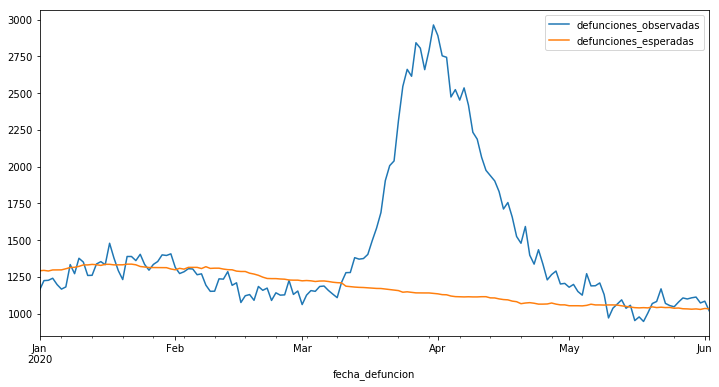

In [103]:
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
df_momo_todos[(df_momo_todos.fecha_defuncion.dt.year == 2020)].plot(kind='line',
                                                      x='fecha_defuncion',
                                                      y='defunciones_observadas',
                                                      ax=ax
                                                    )
df_momo_todos[(df_momo_todos.fecha_defuncion.dt.year == 2020)].plot(kind='line',
                                                      x='fecha_defuncion',
                                                      y='defunciones_esperadas',
                                                      ax=ax
                                                    )

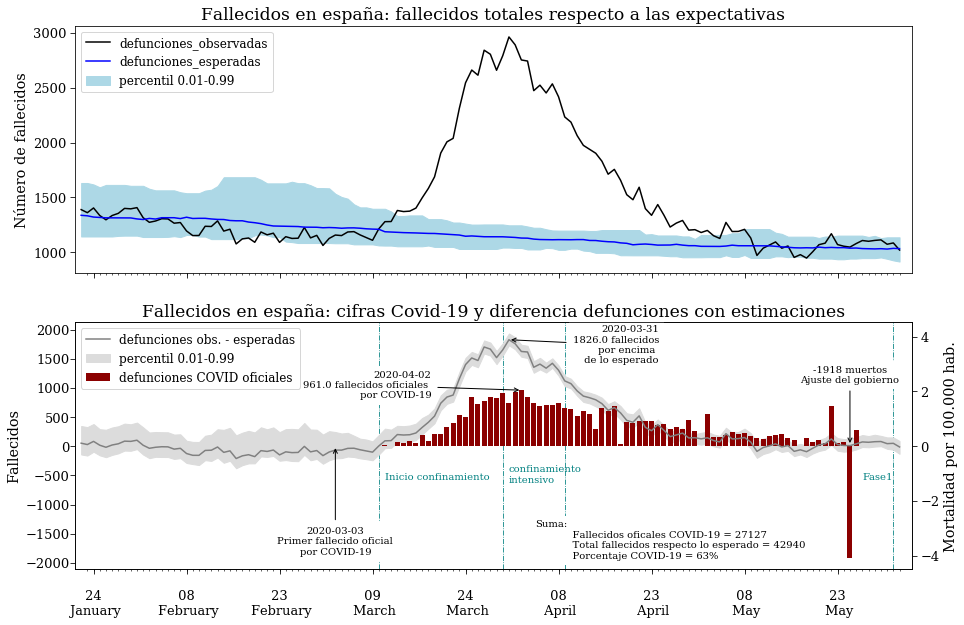

In [136]:
muertes_covid_spain = df_deaths[df_deaths.country == 'Spain'].iloc[:,5:].T.reset_index() \
                    .rename(columns={'index':'Date', 201:'accum'})
muertes_covid_spain['Date'] = pd.to_datetime(muertes_covid_spain['Date'], format='%m/%d/%y')

muertes_covid_spain['deaths_covid'] = muertes_covid_spain.accum.diff()
muertes_covid_spain = muertes_covid_spain.set_index('Date', drop=True)

df_momo_todos = df_momo[(df_momo.nombre_sexo == 'todos') & (df_momo.nombre_gedad == 'todos')] \
                    .rename(columns={'fecha_defuncion':'Date'}) \
                    .set_index('Date', drop=True)


df = df_momo_todos.merge(muertes_covid_spain,left_index=True, right_index=True)
df = df.reset_index()
df['dif_esperados'] = df['defunciones_observadas'] - df['defunciones_esperadas']

df['q99'] = df['defunciones_esperadas_q99'] - df['defunciones_esperadas']
df['q01'] = df['defunciones_esperadas'] - df['defunciones_esperadas_q01']

df['m99'] = df['defunciones_observadas'] + df['q99']
df['m01'] = df['defunciones_observadas'] - df['q01']

df['e99'] = df['dif_esperados'] + df['q99']
df['e01'] = df['dif_esperados'] - df['q01']

import os
from matplotlib import font_manager as fm, rcParams
rcParams['font.family'] = 'serif'
rcParams['font.sans-serif'] = 'EB Garamond'


fpath = os.path.join(rcParams["datapath"], "EB_Garamond/static/EBGaramond-Medium.ttf")
prop = fm.FontProperties(fname=fpath)
fname = os.path.split(fpath)[1]

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(211)
ax2 = fig.add_subplot(212, sharex=ax)


df[(df.Date.dt.year == 2020)].loc[:,'defunciones_observadas'].plot(kind='line',
                                                                   ax=ax,
                                                                   color='black',
                                                                  ).set_label('defunciones')
df[(df.Date.dt.year == 2020)].loc[:,'defunciones_esperadas'].plot(kind='line',
                                                                  ax=ax,
                                                                  color='blue'
                                                                 ).set_label('defunciones esperadas')

ax.fill_between(df[(df.Date.dt.year == 2020)].index,
                df[(df.Date.dt.year == 2020)].loc[:,'defunciones_esperadas_q01'],
                df[(df.Date.dt.year == 2020)].loc[:,'defunciones_esperadas_q99'],
                color='lightblue'
               ).set_label('percentil 0.01-0.99')

hfont = {'fontname':'EB Garamond'}
ax.legend(loc="upper left",
          fontsize='large'
          )



df[(df.Date.dt.year == 2020)].loc[:,'deaths_covid'].plot(kind='bar',
                                                         ax=ax2,
                                                         width=0.8,
                                                         color='darkred'
                                                    ).set_label('defunciones COVID oficiales')

df[(df.Date.dt.year == 2020)].loc[:,'dif_esperados'].plot(kind='line',
                                                          ax=ax2,
                                                          color='gray'
                                                    ).set_label('fallecidos - esperados')

ax2.fill_between(df[(df.Date.dt.year == 2020)].index,
                df[(df.Date.dt.year == 2020)].loc[:,'e01'],
                df[(df.Date.dt.year == 2020)].loc[:,'e99'],
                color='gainsboro',
               )
#df[(df.Date.dt.year == 2020)].loc[:,['e01','e99']].plot(kind='line',
#                                                      ax=ax2
#                                                    )
ax2.legend(['defunciones obs. - esperadas','percentil 0.01-0.99','defunciones COVID oficiales'],
           loc="upper left",
           fontsize='large'
          )

#xticks Indices fechas

l = len(df[(df.Date.dt.year == 2020)])
ind = np.arange(2,l,15).tolist()

ax2.set_xticklabels(df[(df.Date.dt.year == 2020)].Date[ind].dt.strftime('\n %d \n %B'), 
                    rotation=0
                   )
#ax.set_xticks(df.Date[ind].dt.strftime('%d, %B'))

ax.set_xticks(ind)

xticks_minor = np.arange(1,l,1).tolist()
ax2.set_xticks(xticks_minor, minor=True )
ax2.set_xlim(-1, l+1)
ax2.tick_params(pad=0.5)

#lineas verticales confinamientos
fecha_inicio_confinamiento = datetime(2020,3,10)
fecha_endurecimiento_confinamiento = datetime(2020,3,30)
fecha_finendurecimiento_confinamiento = datetime(2020,4,9)

color_lineas = 'teal'
yyy = -620
indice_inicio_confinamiento = df[(df.Date.dt.year == 2020)].loc[df.Date == fecha_inicio_confinamiento].index.values[0]
ax2.axvline(x=indice_inicio_confinamiento,
            ls='-.', 
            lw=0.8,
            zorder = 0,
            color=color_lineas)
ax2.text(indice_inicio_confinamiento+1,yyy+50,
         "Inicio confinamiento",
         rotation=0,
         color=color_lineas)


indice_inicio_confinamiento = df[(df.Date.dt.year == 2020)].loc[df.Date == fecha_endurecimiento_confinamiento].index.values[0]
ax2.axvline(x=indice_inicio_confinamiento,
            ls='-.', 
            lw=0.8,
            zorder = 0,
            color=color_lineas)
ax2.text(indice_inicio_confinamiento+1,yyy,
         "confinamiento\nintensivo",
         rotation=0,
         color=color_lineas)

indice_inicio_confinamiento = df[(df.Date.dt.year == 2020)].loc[df.Date == fecha_finendurecimiento_confinamiento].index.values[0]
ax2.axvline(x=indice_inicio_confinamiento,
            ls='-.', 
            lw=0.8,
            zorder = 0,
            color=color_lineas)





ax.set_title('Fallecidos en españa: fallecidos totales respecto a las expectativas', fontsize='xx-large')
ax2.set_title('Fallecidos en españa: cifras Covid-19 y diferencia defunciones con estimaciones', fontsize='xx-large')
ax.set_ylabel('Número de fallecidos',fontsize='x-large')
ax2.set_ylabel('Fallecidos',fontsize='x-large')
ax.tick_params(size=5,labelsize = 13)
ax2.tick_params(size=5,labelsize = 13)

#w = df[(df.Date.dt.year == 2020)].Date.dt.weekday.tolist()
#weekDays = ("L","M","X","J","V","S","D")
#ww = list(map(lambda x: weekDays[x], w))

ax_c = ax2.twinx()

y1, y2 = ax2.get_ylim()
ax_c.set_ylim(y1/46940000*100000, y2/46940000*100000)
ax_c.figure.canvas.draw()
ax_c.set_ylabel('Mortalidad por 100.000 hab.',fontsize='x-large')
ax_c.tick_params(size=5,labelsize = 13)

maximo1i=df[(df.Date.dt.year == 2020)]['dif_esperados'].idxmax()
maximo1=df[(df.Date.dt.year == 2020)]['dif_esperados'].max()

maximo2i=df[(df.Date.dt.year == 2020)]['deaths_covid'].idxmax()
maximo2=df[(df.Date.dt.year == 2020)]['deaths_covid'].max()

ax2.annotate("{}\n{} fallecidos\n por encima \n de lo esperado".format(df.Date.dt.date.iloc[maximo1i],maximo1), 
             (maximo1i,maximo1), 
             xytext=(150, 15), 
             xycoords='data', 
             arrowprops=dict(arrowstyle='->'),
             textcoords='offset points',
             backgroundcolor="w",
             horizontalalignment='right', verticalalignment='top')

ax2.annotate("{}\n{} fallecidos oficiales \n por COVID-19".format(df.Date.dt.date.iloc[maximo2i],maximo2), 
             (maximo2i,maximo2), 
             xytext=(-90, 20), 
             xycoords='data', 
             arrowprops=dict(arrowstyle='->'),
             textcoords='offset points',
             backgroundcolor="w",
             horizontalalignment='right', verticalalignment='top')


muertos_totales_covid = df[(df.Date.dt.year == 2020)]['deaths_covid'].sum()
diferencia_total = df[(df.Date.dt.year == 2020) & (df.deaths_covid>0)]['dif_esperados'].sum()
error = muertos_totales_covid/diferencia_total*100

ax2.annotate("""Suma:
            Fallecidos oficales COVID-19 = {:.0f}
            Total fallecidos respecto lo esperado = {:.0f}
            Porcentaje COVID-19 = {:.0f}%""".format(muertos_totales_covid,
                                                    diferencia_total,
                                                    error
                                                   ), 
             (0.55,0.2), 
             xytext=(0, 0), 
             xycoords='axes fraction', 
             textcoords='offset points',
             backgroundcolor="w",
             horizontalalignment='left', verticalalignment='top')


primer_muerto = df[(df.Date.dt.year == 2020) & (df.deaths_covid>0)].Date.iloc[0]
pos1 = df[(df.Date == primer_muerto)].index.values[0]

ax2.annotate("{}\nPrimer fallecido oficial\npor COVID-19".format(primer_muerto.strftime("%Y-%m-%d"),
                                                                ), 
             (pos1,0), 
             xytext=(0, -80), 
             xycoords='data', 
             arrowprops=dict(arrowstyle='->'),
             textcoords='offset points',
             backgroundcolor="w",
             horizontalalignment='center', verticalalignment='top')

day_to_mark = pd.Timestamp(2020, 5, 25)
filter_mask = df.Date == day_to_mark
day_index = df[filter_mask].index

ax2.annotate("{:.0f} muertos\nAjuste del gobierno".format(df.iloc[day_index]['deaths_covid'].values[0],                                                                ), 
             (day_index.values[0],20), 
             xytext=(0, +80), 
             xycoords='data', 
             arrowprops=dict(arrowstyle='->'),
             textcoords='offset points',
             backgroundcolor="w",
             horizontalalignment='center', verticalalignment='top')

color_lineas = 'teal'
yyy = -620
indice_fase1 = df[(df.Date.dt.year == 2020)].loc[df.Date == pd.Timestamp(2020, 6, 1)].index.values[0]
ax2.axvline(x=indice_fase1,
            ls='-.', 
            lw=0.8,
            zorder = 0,
            color=color_lineas)
ax2.text(indice_fase1-5,yyy+50,
         "Fase1",
         rotation=0,
         color=color_lineas)

#ax2.annotate('Something', (0,0), (0, -20), xycoords='axes fraction', textcoords='offset points', va='top')

plt.savefig(out+'comparacion_fallecidos_totales.png')


In [105]:
fecha_inicio_confinamiento

datetime.datetime(2020, 3, 10, 0, 0)

In [106]:
df[(df.Date.dt.year == 2020)].loc[df.Date == fecha_inicio_confinamiento]

,Date,cod_sexo,nombre_sexo,cod_gedad,nombre_gedad,defunciones_observadas,defunciones_observadas_lim_inf,defunciones_observadas_lim_sup,defunciones_esperadas,defunciones_esperadas_q01,defunciones_esperadas_q99,accum,deaths_covid,dif_esperados,q99,q01,m99,m01,e99,e01
48,2020-03-10,all,todos,all,todos,1212,1212.0,1212.0,1208.5,1061.07,1395.77,35,7.0,3.5,187.27,147.43,1399.27,1064.57,190.77,-143.93


In [122]:
day_to_mark = pd.Timestamp(2020, 5, 25)
filter_mask = df.Date == day_to_mark
day_index = df[filter_mask].index

In [119]:
df.Date.dt.date.iloc[day_index]

123    2020-05-24
Name: Date, dtype: object

In [123]:
df.iloc[day_index]['deaths_covid']

124   -1918.0
Name: deaths_covid, dtype: float64

In [129]:
df.iloc[day_index]['deaths_covid'].values[0]

-1918.0